# A Diffusion Model from Scratch in Pytorch

In this notebook I want to build a very simple (as few code as possible) Diffusion Model for generating car images. I will explain all the theoretical details in the YouTube video.


**Sources:**
- Github implementation [Denoising Diffusion Pytorch](https://github.com/lucidrains/denoising-diffusion-pytorch)
- Niels Rogge, Kashif Rasul, [Huggingface notebook](https://colab.research.google.com/github/huggingface/notebooks/blob/main/examples/annotated_diffusion.ipynb#scrollTo=3a159023)
- Papers on Diffusion models ([Dhariwal, Nichol, 2021], [Ho et al., 2020] ect.)


## Investigating the dataset

As dataset we use the StandordCars Dataset, which consists of around 8000 images in the train set. Let's see if this is enough to get good results ;-)

In [1]:
!pip install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu118

Defaulting to user installation because normal site-packages is not writeable
Looking in indexes: https://download.pytorch.org/whl/cu118



[notice] A new release of pip is available: 24.2 -> 24.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [2]:
import torch
print(torch.cuda.is_available())  # Should print True
print(torch.version.cuda)         # Should print the CUDA version
print(torch.cuda.get_device_name(0))  # Should print your GPU's name if available


True
11.8
NVIDIA GeForce GTX 1660 Ti


In [3]:
import torch
print(torch.cuda.is_available())  # Should print True if GPU is available
print(torch.cuda)

True
<module 'torch.cuda' from 'C:\\Users\\Owner\\AppData\\Roaming\\Python\\Python312\\site-packages\\torch\\cuda\\__init__.py'>


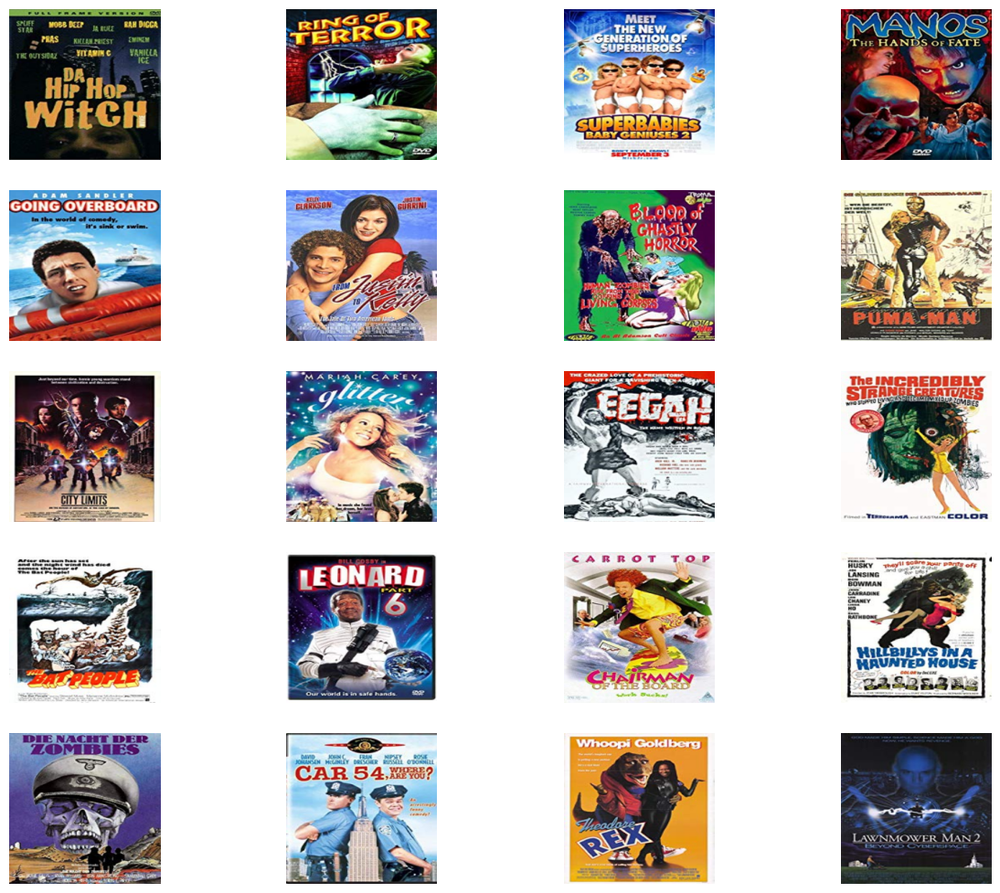

In [4]:
import torch
import torchvision
from torchvision import transforms
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
from torchvision.datasets import ImageFolder

def show_images(dataset, num_samples=20, cols=4):
    """ Plots some samples from the dataset """
    plt.figure(figsize=(15,15))
    for i, (img, label) in enumerate(dataset):
        if i == num_samples:
            break
        plt.subplot(int(num_samples/cols) + 1, cols, i + 1)
        plt.imshow(img.permute(1, 2, 0))  # Convert CHW to HWC format for matplotlib
        plt.axis('off')
    plt.show()

# Directory where your images are stored (e.g., on your desktop)
data_dir = 'C:\\Users\\Owner\\Downloads\\archive'

# Define any necessary transforms
transform = transforms.Compose([
    transforms.Resize((224, 224)),  # Resize images to a standard size
    transforms.ToTensor(),  # Convert images to tensors
])

# Load dataset using ImageFolder
dataset = ImageFolder(root=data_dir, transform=transform)

# Show a sample of images from the dataset
show_images(dataset)


Later in this notebook we will do some additional modifications to this dataset, for example make the images smaller, convert them to tensors ect.

# Building the Diffusion Model


## Step 1: The forward process = Noise scheduler




We first need to build the inputs for our model, which are more and more noisy images. Instead of doing this sequentially, we can use the closed form provided in the papers to calculate the image for any of the timesteps individually.

**Key Takeaways**:
- The noise-levels/variances can be pre-computed
- There are different types of variance schedules
- We can sample each timestep image independently (Sums of Gaussians is also Gaussian)
- No model is needed in this forward step

In [5]:
import torch.nn.functional as F

def linear_beta_schedule(timesteps, start=0.0001, end=0.02):
    return torch.linspace(start, end, timesteps)

def get_index_from_list(vals, t, x_shape):
    """
    Returns a specific index t of a passed list of values vals
    while considering the batch dimension.
    """
    batch_size = t.shape[0]
    out = vals.gather(-1, t.cpu())
    return out.reshape(batch_size, *((1,) * (len(x_shape) - 1))).to(t.device)

def forward_diffusion_sample(x_0, t, device="cpu"):
    """
    Takes an image and a timestep as input and
    returns the noisy version of it
    """
    noise = torch.randn_like(x_0)
    sqrt_alphas_cumprod_t = get_index_from_list(sqrt_alphas_cumprod, t, x_0.shape)
    sqrt_one_minus_alphas_cumprod_t = get_index_from_list(
        sqrt_one_minus_alphas_cumprod, t, x_0.shape
    )
    # mean + variance
    return sqrt_alphas_cumprod_t.to(device) * x_0.to(device) \
    + sqrt_one_minus_alphas_cumprod_t.to(device) * noise.to(device), noise.to(device)


# Define beta schedule
T = 300
betas = linear_beta_schedule(timesteps=T)

# Pre-calculate different terms for closed form
alphas = 1. - betas
alphas_cumprod = torch.cumprod(alphas, axis=0)
alphas_cumprod_prev = F.pad(alphas_cumprod[:-1], (1, 0), value=1.0)
sqrt_recip_alphas = torch.sqrt(1.0 / alphas)
sqrt_alphas_cumprod = torch.sqrt(alphas_cumprod)
sqrt_one_minus_alphas_cumprod = torch.sqrt(1. - alphas_cumprod)
posterior_variance = betas * (1. - alphas_cumprod_prev) / (1. - alphas_cumprod)

Let's test it on our dataset ...

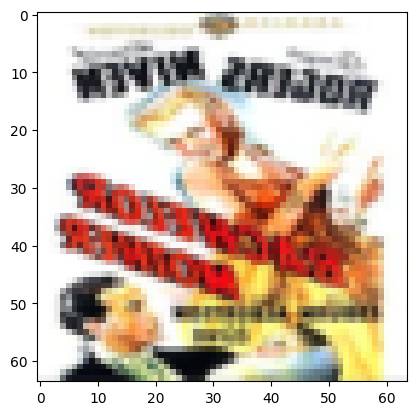

In [6]:
import torch
import torchvision
from torchvision import transforms
from torch.utils.data import DataLoader
import numpy as np
import os
import matplotlib.pyplot as plt

IMG_SIZE = 64
BATCH_SIZE = 128

def load_transformed_dataset(folder_path):
    data_transforms = [
        transforms.Resize((IMG_SIZE, IMG_SIZE)),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),  # Scales data into [0,1]
        transforms.Lambda(lambda t: (t * 2) - 1)  # Scale between [-1, 1]
    ]
    data_transform = transforms.Compose(data_transforms)

    # Load images from the folder using ImageFolder
    dataset = torchvision.datasets.ImageFolder(root=folder_path, transform=data_transform)

    return dataset

def show_tensor_image(image):
    reverse_transforms = transforms.Compose([
        transforms.Lambda(lambda t: (t + 1) / 2),  # Rescale to [0,1]
        transforms.Lambda(lambda t: t.permute(1, 2, 0)),  # CHW to HWC
        transforms.Lambda(lambda t: t * 255.),
        transforms.Lambda(lambda t: t.numpy().astype(np.uint8)),
        transforms.ToPILImage(),
    ])

    # Take the first image of the batch
    if len(image.shape) == 4:
        image = image[0, :, :, :]
    plt.imshow(reverse_transforms(image))

# Load dataset from the folder
data = load_transformed_dataset(data_dir)

# Create DataLoader for batching
dataloader = DataLoader(data, batch_size=BATCH_SIZE, shuffle=True, drop_last=True)

# Show an example of the dataset (first batch of images)
for images, labels in dataloader:
    show_tensor_image(images)
    break  # Show only the first batch


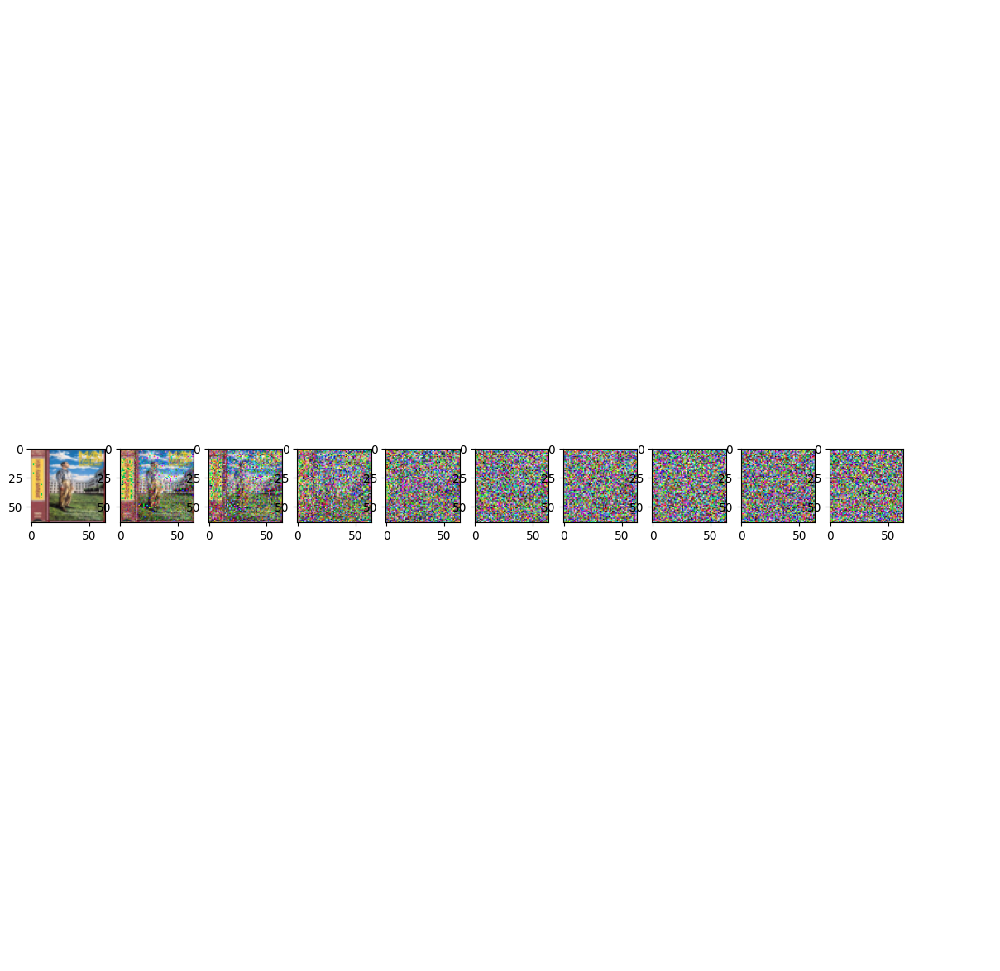

In [7]:
# Simulate forward diffusion
image = next(iter(dataloader))[0]

plt.figure(figsize=(15,15))
plt.axis('off')
num_images = 10
stepsize = int(T/num_images)

for idx in range(0, T, stepsize):
    t = torch.Tensor([idx]).type(torch.int64)
    plt.subplot(1, num_images+1, int(idx/stepsize) + 1)
    img, noise = forward_diffusion_sample(image, t)
    show_tensor_image(img)

## Step 2: The backward process = U-Net



For a great introduction to UNets, have a look at this post: https://amaarora.github.io/2020/09/13/unet.html.


**Key Takeaways**:
- We use a simple form of a UNet for to predict the noise in the image
- The input is a noisy image, the ouput the noise in the image
- Because the parameters are shared accross time, we need to tell the network in which timestep we are
- The Timestep is encoded by the transformer Sinusoidal Embedding
- We output one single value (mean), because the variance is fixed


In [8]:
from torch import nn
import math


class Block(nn.Module):
    def __init__(self, in_ch, out_ch, time_emb_dim, up=False):
        super().__init__()
        self.time_mlp =  nn.Linear(time_emb_dim, out_ch)
        if up:
            self.conv1 = nn.Conv2d(2*in_ch, out_ch, 3, padding=1)
            self.transform = nn.ConvTranspose2d(out_ch, out_ch, 4, 2, 1)
        else:
            self.conv1 = nn.Conv2d(in_ch, out_ch, 3, padding=1)
            self.transform = nn.Conv2d(out_ch, out_ch, 4, 2, 1)
        self.conv2 = nn.Conv2d(out_ch, out_ch, 3, padding=1)
        self.bnorm1 = nn.BatchNorm2d(out_ch)
        self.bnorm2 = nn.BatchNorm2d(out_ch)
        self.relu  = nn.ReLU()

    def forward(self, x, t, ):
        # First Conv
        h = self.bnorm1(self.relu(self.conv1(x)))
        # Time embedding
        time_emb = self.relu(self.time_mlp(t))
        # Extend last 2 dimensions
        time_emb = time_emb[(..., ) + (None, ) * 2]
        # Add time channel
        h = h + time_emb
        # Second Conv
        h = self.bnorm2(self.relu(self.conv2(h)))
        # Down or Upsample
        return self.transform(h)


class SinusoidalPositionEmbeddings(nn.Module):
    def __init__(self, dim):
        super().__init__()
        self.dim = dim

    def forward(self, time):
        device = time.device
        half_dim = self.dim // 2
        embeddings = math.log(10000) / (half_dim - 1)
        embeddings = torch.exp(torch.arange(half_dim, device=device) * -embeddings)
        embeddings = time[:, None] * embeddings[None, :]
        embeddings = torch.cat((embeddings.sin(), embeddings.cos()), dim=-1)
        # TODO: Double check the ordering here
        return embeddings


class SimpleUnet(nn.Module):
    """
    A simplified variant of the Unet architecture.
    """
    def __init__(self):
        super().__init__()
        image_channels = 3
        down_channels = (64, 128, 256, 512, 1024)
        up_channels = (1024, 512, 256, 128, 64)
        out_dim = 3
        time_emb_dim = 32

        # Time embedding
        self.time_mlp = nn.Sequential(
                SinusoidalPositionEmbeddings(time_emb_dim),
                nn.Linear(time_emb_dim, time_emb_dim),
                nn.ReLU()
            )

        # Initial projection
        self.conv0 = nn.Conv2d(image_channels, down_channels[0], 3, padding=1)

        # Downsample
        self.downs = nn.ModuleList([Block(down_channels[i], down_channels[i+1], \
                                    time_emb_dim) \
                    for i in range(len(down_channels)-1)])
        # Upsample
        self.ups = nn.ModuleList([Block(up_channels[i], up_channels[i+1], \
                                        time_emb_dim, up=True) \
                    for i in range(len(up_channels)-1)])

        # Edit: Corrected a bug found by Jakub C (see YouTube comment)
        self.output = nn.Conv2d(up_channels[-1], out_dim, 1)

    def forward(self, x, timestep):
        # Embedd time
        t = self.time_mlp(timestep)
        # Initial conv
        x = self.conv0(x)
        # Unet
        residual_inputs = []
        for down in self.downs:
            x = down(x, t)
            residual_inputs.append(x)
        for up in self.ups:
            residual_x = residual_inputs.pop()
            # Add residual x as additional channels
            x = torch.cat((x, residual_x), dim=1)
            x = up(x, t)
        return self.output(x)

model = SimpleUnet()
print("Num params: ", sum(p.numel() for p in model.parameters()))
model

Num params:  62438883


SimpleUnet(
  (time_mlp): Sequential(
    (0): SinusoidalPositionEmbeddings()
    (1): Linear(in_features=32, out_features=32, bias=True)
    (2): ReLU()
  )
  (conv0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (downs): ModuleList(
    (0): Block(
      (time_mlp): Linear(in_features=32, out_features=128, bias=True)
      (conv1): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (transform): Conv2d(128, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (conv2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (bnorm1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (bnorm2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU()
    )
    (1): Block(
      (time_mlp): Linear(in_features=32, out_features=256, bias=True)
      (conv1): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (transfor


**Further improvements that can be implemented:**
- Residual connections
- Different activation functions like SiLU, GWLU, ...
- BatchNormalization
- GroupNormalization
- Attention
- ...

## Step 3: The loss



**Key Takeaways:**
- After some maths we end up with a very simple loss function
- There are other possible choices like L2 loss ect.


In [9]:
def get_loss(model, x_0, t):
    x_noisy, noise = forward_diffusion_sample(x_0, t, device)
    noise_pred = model(x_noisy, t)
    return F.l1_loss(noise, noise_pred)

## Sampling
- Without adding @torch.no_grad() we quickly run out of memory, because pytorch tacks all the previous images for gradient calculation
- Because we pre-calculated the noise variances for the forward pass, we also have to use them when we sequentially perform the backward process

In [10]:
@torch.no_grad()
def sample_timestep(x, t):
    """
    Calls the model to predict the noise in the image and returns
    the denoised image.
    Applies noise to this image, if we are not in the last step yet.
    """
    betas_t = get_index_from_list(betas, t, x.shape)
    sqrt_one_minus_alphas_cumprod_t = get_index_from_list(
        sqrt_one_minus_alphas_cumprod, t, x.shape
    )
    sqrt_recip_alphas_t = get_index_from_list(sqrt_recip_alphas, t, x.shape)

    # Call model (current image - noise prediction)
    model_mean = sqrt_recip_alphas_t * (
        x - betas_t * model(x, t) / sqrt_one_minus_alphas_cumprod_t
    )
    posterior_variance_t = get_index_from_list(posterior_variance, t, x.shape)

    if t == 0:
        # As pointed out by Luis Pereira (see YouTube comment)
        # The t's are offset from the t's in the paper
        return model_mean
    else:
        noise = torch.randn_like(x)
        return model_mean + torch.sqrt(posterior_variance_t) * noise

@torch.no_grad()
def sample_plot_image():
    # Sample noise
    img_size = IMG_SIZE
    img = torch.randn((1, 3, img_size, img_size), device=device)
    plt.figure(figsize=(15,15))
    plt.axis('off')
    num_images = 10
    stepsize = int(T/num_images)

    for i in range(0,T)[::-1]:
        t = torch.full((1,), i, device=device, dtype=torch.long)
        img = sample_timestep(img, t)
        # Edit: This is to maintain the natural range of the distribution
        img = torch.clamp(img, -1.0, 1.0)
        if i % stepsize == 0:
            plt.subplot(1, num_images, int(i/stepsize)+1)
            show_tensor_image(img.detach().cpu())
    plt.show()

## Training

In [11]:
# Assuming 'dataloader' is defined
steps_per_epoch = len(dataloader)
print(f"Steps per epoch: {steps_per_epoch}")


Steps per epoch: 64


Starting epoch 0
Epoch 0, Step 0, Loss: 0.8072308897972107
Epoch 0, Step 1, Loss: 0.7519592046737671
Epoch 0, Step 2, Loss: 0.7221542596817017
Epoch 0, Step 3, Loss: 0.6939825415611267
Epoch 0, Step 4, Loss: 0.6579932570457458
Epoch 0, Step 5, Loss: 0.6354596614837646
Epoch 0, Step 6, Loss: 0.6068053245544434
Epoch 0, Step 7, Loss: 0.5774758458137512
Epoch 0, Step 8, Loss: 0.5430488586425781
Epoch 0, Step 9, Loss: 0.5113677978515625
Epoch 0, Step 10, Loss: 0.4872604310512543
Epoch 0, Step 11, Loss: 0.4732416570186615
Epoch 0, Step 12, Loss: 0.4405395984649658
Epoch 0, Step 13, Loss: 0.4339885711669922
Epoch 0, Step 14, Loss: 0.4191513955593109
Epoch 0, Step 15, Loss: 0.43938812613487244
Epoch 0, Step 16, Loss: 0.42474907636642456
Epoch 0, Step 17, Loss: 0.43704280257225037
Epoch 0, Step 18, Loss: 0.42962682247161865
Epoch 0, Step 19, Loss: 0.36431631445884705
Epoch 0, Step 20, Loss: 0.3621290624141693
Epoch 0, Step 21, Loss: 0.3475152850151062
Epoch 0, Step 22, Loss: 0.3716133534908294

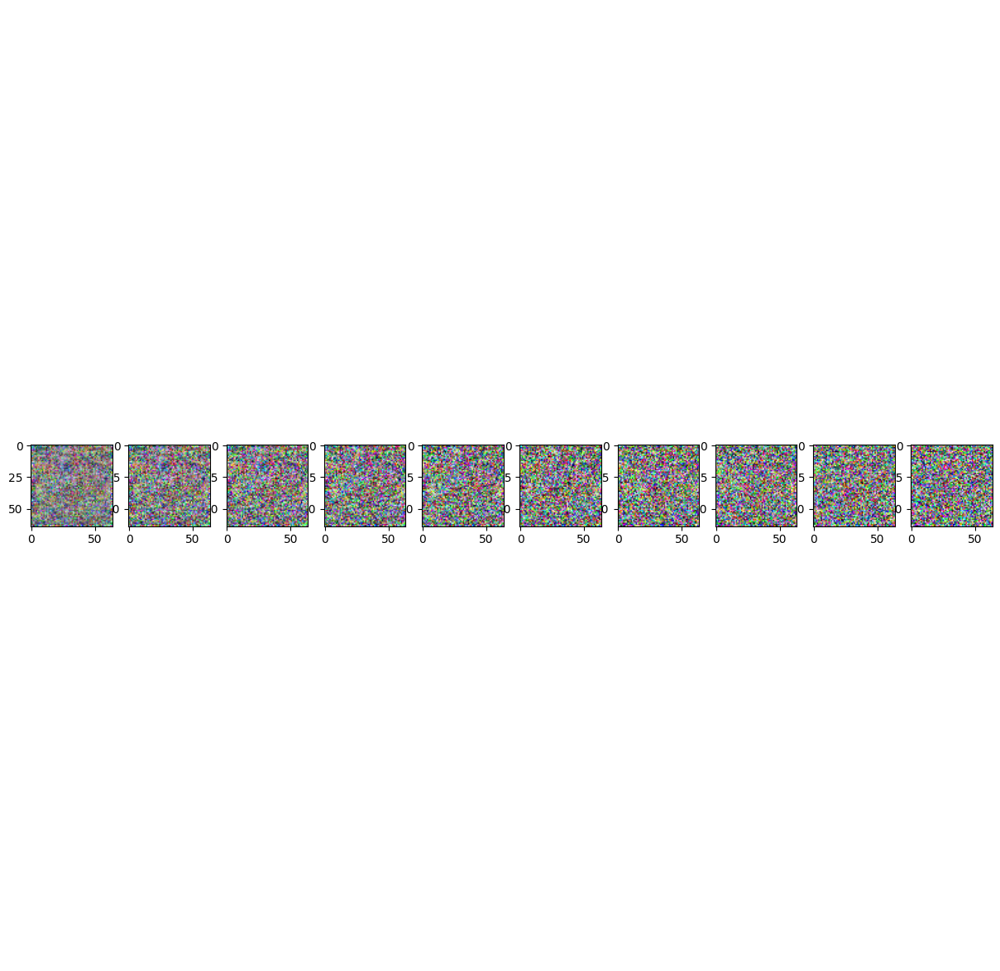

Starting epoch 1
Epoch 1, Step 0, Loss: 0.2688623070716858
Epoch 1, Step 1, Loss: 0.2871248722076416
Epoch 1, Step 2, Loss: 0.28273382782936096
Epoch 1, Step 3, Loss: 0.2846677005290985
Epoch 1, Step 4, Loss: 0.27720367908477783
Epoch 1, Step 5, Loss: 0.29257601499557495
Epoch 1, Step 6, Loss: 0.2696214020252228
Epoch 1, Step 7, Loss: 0.30626970529556274
Epoch 1, Step 8, Loss: 0.29273924231529236
Epoch 1, Step 9, Loss: 0.28518760204315186
Epoch 1, Step 10, Loss: 0.3050152063369751
Epoch 1, Step 11, Loss: 0.2806354761123657
Epoch 1, Step 12, Loss: 0.28458309173583984
Epoch 1, Step 13, Loss: 0.2671481966972351
Epoch 1, Step 14, Loss: 0.2743966281414032
Epoch 1, Step 15, Loss: 0.2563879191875458
Epoch 1, Step 16, Loss: 0.280790239572525
Epoch 1, Step 17, Loss: 0.281766414642334
Epoch 1, Step 18, Loss: 0.2691531479358673
Epoch 1, Step 19, Loss: 0.2740645110607147
Epoch 1, Step 20, Loss: 0.2543828785419464
Epoch 1, Step 21, Loss: 0.2761272192001343
Epoch 1, Step 22, Loss: 0.2674174308776855

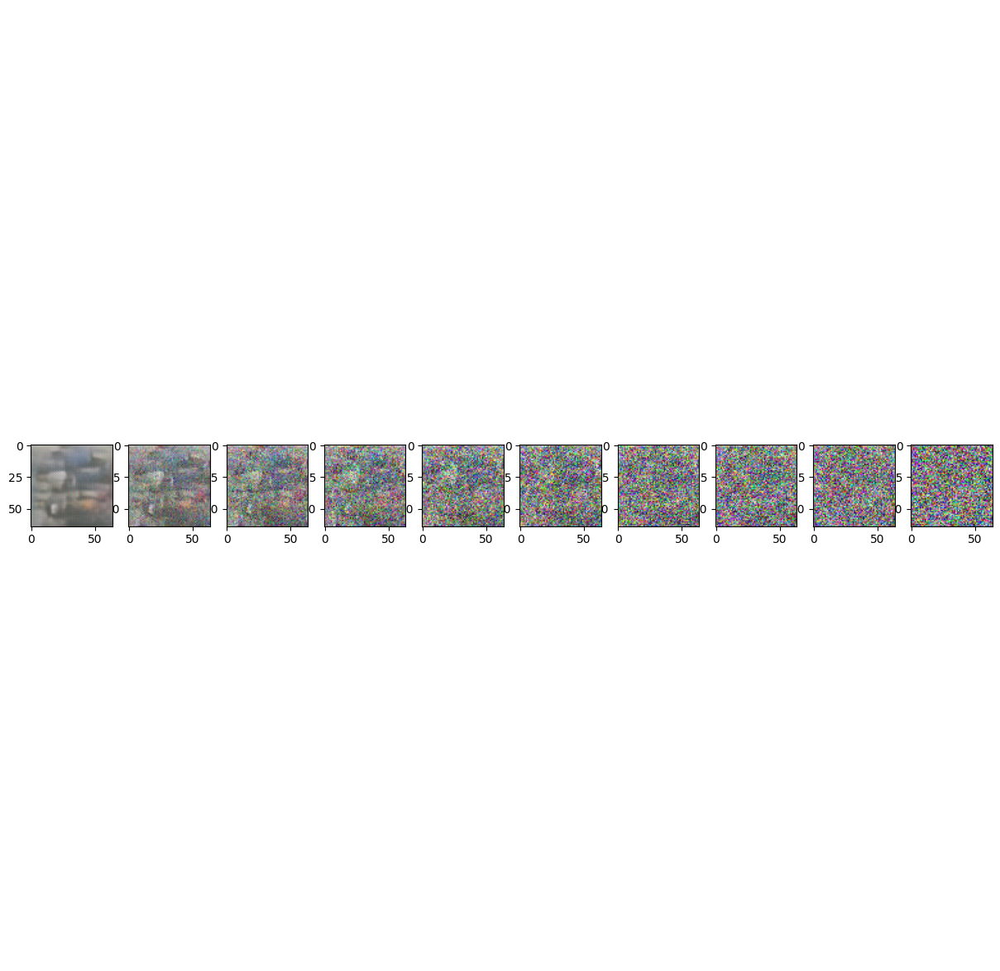

Starting epoch 6
Epoch 6, Step 0, Loss: 0.22523169219493866
Epoch 6, Step 1, Loss: 0.205542653799057
Epoch 6, Step 2, Loss: 0.2256052941083908
Epoch 6, Step 3, Loss: 0.21815332770347595
Epoch 6, Step 4, Loss: 0.1906275451183319
Epoch 6, Step 5, Loss: 0.21990624070167542
Epoch 6, Step 6, Loss: 0.2071443796157837
Epoch 6, Step 7, Loss: 0.20629321038722992
Epoch 6, Step 8, Loss: 0.20377391576766968
Epoch 6, Step 9, Loss: 0.2060442864894867
Epoch 6, Step 10, Loss: 0.18957924842834473
Epoch 6, Step 11, Loss: 0.18272921442985535
Epoch 6, Step 12, Loss: 0.22811810672283173
Epoch 6, Step 13, Loss: 0.2039593756198883
Epoch 6, Step 14, Loss: 0.20412757992744446
Epoch 6, Step 15, Loss: 0.2069331705570221
Epoch 6, Step 16, Loss: 0.21729344129562378
Epoch 6, Step 17, Loss: 0.2133851945400238
Epoch 6, Step 18, Loss: 0.19315829873085022
Epoch 6, Step 19, Loss: 0.20140646398067474
Epoch 6, Step 20, Loss: 0.2005615085363388
Epoch 6, Step 21, Loss: 0.2169175148010254
Epoch 6, Step 22, Loss: 0.2051557749

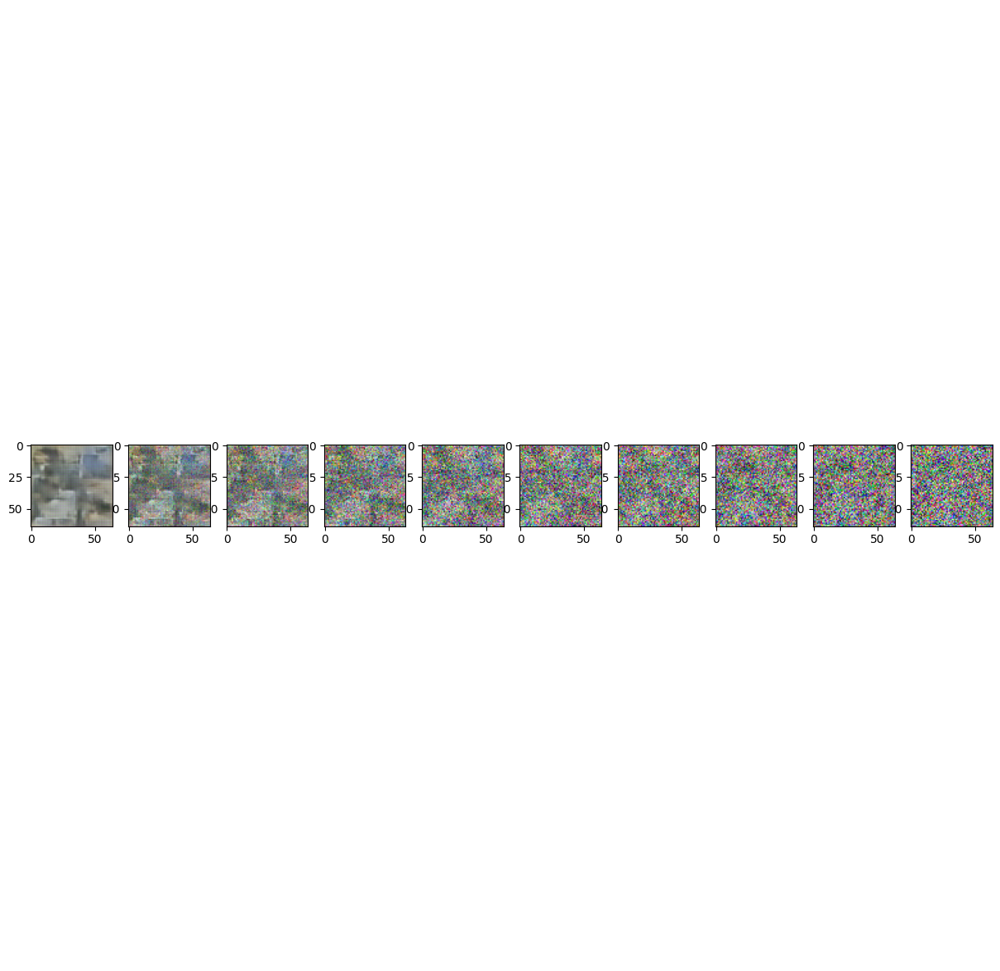

Starting epoch 11
Epoch 11, Step 0, Loss: 0.22061192989349365
Epoch 11, Step 1, Loss: 0.21142122149467468
Epoch 11, Step 2, Loss: 0.2117701768875122
Epoch 11, Step 3, Loss: 0.19410917162895203
Epoch 11, Step 4, Loss: 0.22117310762405396
Epoch 11, Step 5, Loss: 0.1947038471698761
Epoch 11, Step 6, Loss: 0.1810237169265747
Epoch 11, Step 7, Loss: 0.20375239849090576
Epoch 11, Step 8, Loss: 0.19319862127304077
Epoch 11, Step 9, Loss: 0.2016737163066864
Epoch 11, Step 10, Loss: 0.19166283309459686
Epoch 11, Step 11, Loss: 0.19023077189922333
Epoch 11, Step 12, Loss: 0.20092891156673431
Epoch 11, Step 13, Loss: 0.19642400741577148
Epoch 11, Step 14, Loss: 0.20753967761993408
Epoch 11, Step 15, Loss: 0.18495088815689087
Epoch 11, Step 16, Loss: 0.18673840165138245
Epoch 11, Step 17, Loss: 0.1892770230770111
Epoch 11, Step 18, Loss: 0.2006424516439438
Epoch 11, Step 19, Loss: 0.19405865669250488
Epoch 11, Step 20, Loss: 0.18986277282238007
Epoch 11, Step 21, Loss: 0.20252172648906708
Epoch 11

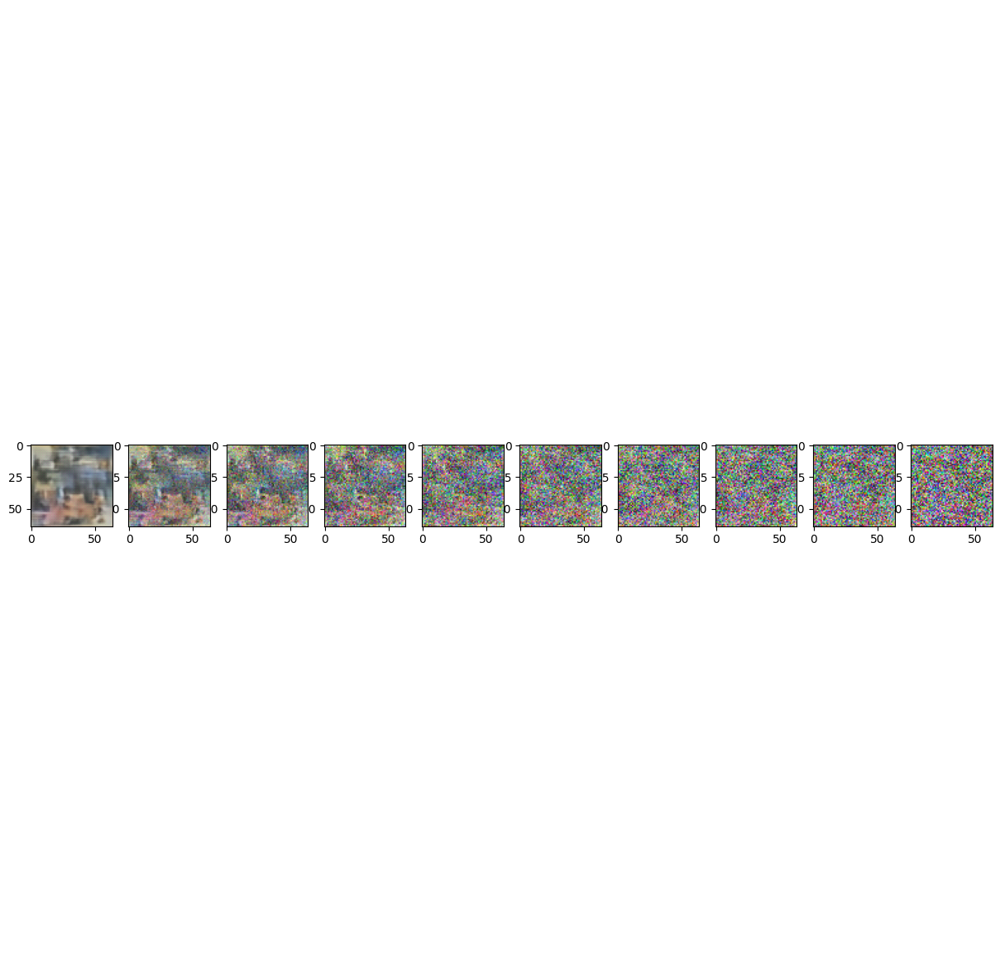

Starting epoch 16
Epoch 16, Step 0, Loss: 0.17297551035881042
Epoch 16, Step 1, Loss: 0.18143664300441742
Epoch 16, Step 2, Loss: 0.18634860217571259
Epoch 16, Step 3, Loss: 0.17729079723358154
Epoch 16, Step 4, Loss: 0.18754355609416962
Epoch 16, Step 5, Loss: 0.16827110946178436
Epoch 16, Step 6, Loss: 0.18920616805553436
Epoch 16, Step 7, Loss: 0.18849299848079681
Epoch 16, Step 8, Loss: 0.1905936300754547
Epoch 16, Step 9, Loss: 0.18693582713603973
Epoch 16, Step 10, Loss: 0.2103596329689026
Epoch 16, Step 11, Loss: 0.18738673627376556
Epoch 16, Step 12, Loss: 0.20333585143089294
Epoch 16, Step 13, Loss: 0.1824914664030075
Epoch 16, Step 14, Loss: 0.18484258651733398
Epoch 16, Step 15, Loss: 0.19544702768325806
Epoch 16, Step 16, Loss: 0.1941644549369812
Epoch 16, Step 17, Loss: 0.17432916164398193
Epoch 16, Step 18, Loss: 0.19393587112426758
Epoch 16, Step 19, Loss: 0.17702297866344452
Epoch 16, Step 20, Loss: 0.1725163757801056
Epoch 16, Step 21, Loss: 0.20177242159843445
Epoch 1

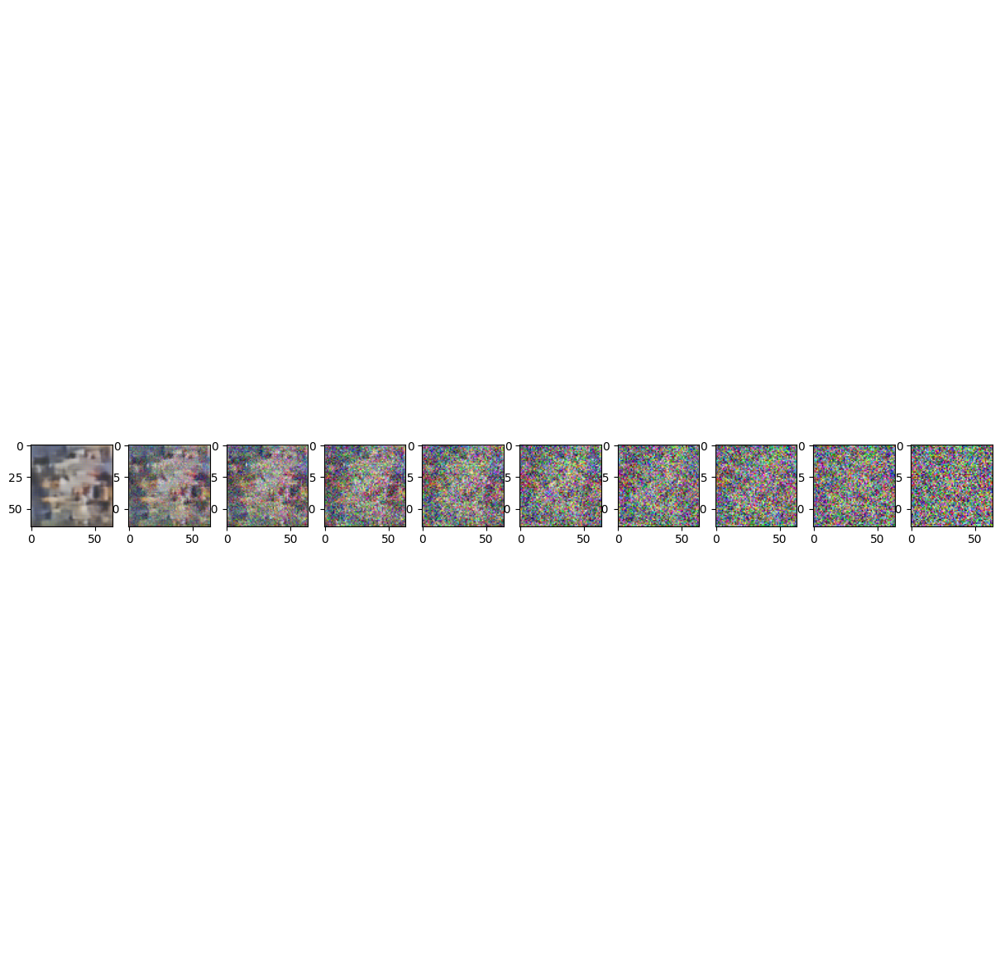

Starting epoch 21
Epoch 21, Step 0, Loss: 0.19052676856517792
Epoch 21, Step 1, Loss: 0.18183617293834686
Epoch 21, Step 2, Loss: 0.1808004081249237
Epoch 21, Step 3, Loss: 0.1882036328315735
Epoch 21, Step 4, Loss: 0.1732538640499115
Epoch 21, Step 5, Loss: 0.20112720131874084
Epoch 21, Step 6, Loss: 0.17702297866344452
Epoch 21, Step 7, Loss: 0.20051977038383484
Epoch 21, Step 8, Loss: 0.1724633276462555
Epoch 21, Step 9, Loss: 0.18527184426784515
Epoch 21, Step 10, Loss: 0.18385028839111328
Epoch 21, Step 11, Loss: 0.1882324516773224
Epoch 21, Step 12, Loss: 0.17660531401634216
Epoch 21, Step 13, Loss: 0.16523867845535278
Epoch 21, Step 14, Loss: 0.19422921538352966
Epoch 21, Step 15, Loss: 0.1716669797897339
Epoch 21, Step 16, Loss: 0.197971373796463
Epoch 21, Step 17, Loss: 0.18272626399993896
Epoch 21, Step 18, Loss: 0.1930466592311859
Epoch 21, Step 19, Loss: 0.18093502521514893
Epoch 21, Step 20, Loss: 0.19742119312286377
Epoch 21, Step 21, Loss: 0.17945264279842377
Epoch 21, S

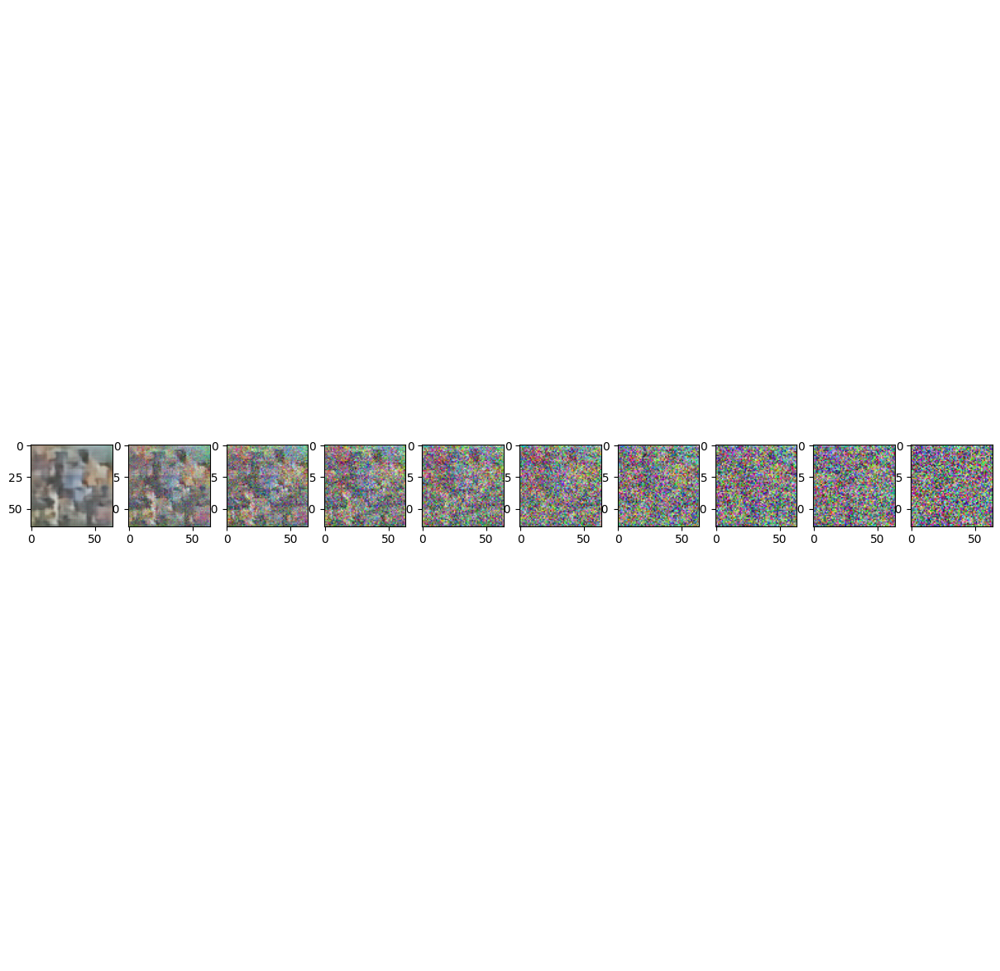

Starting epoch 26
Epoch 26, Step 0, Loss: 0.18217281997203827
Epoch 26, Step 1, Loss: 0.193503737449646
Epoch 26, Step 2, Loss: 0.1825629472732544
Epoch 26, Step 3, Loss: 0.18033263087272644
Epoch 26, Step 4, Loss: 0.18049702048301697
Epoch 26, Step 5, Loss: 0.19685333967208862
Epoch 26, Step 6, Loss: 0.18137089908123016
Epoch 26, Step 7, Loss: 0.17109529674053192
Epoch 26, Step 8, Loss: 0.18026447296142578
Epoch 26, Step 9, Loss: 0.1875275820493698
Epoch 26, Step 10, Loss: 0.17933952808380127
Epoch 26, Step 11, Loss: 0.17144593596458435
Epoch 26, Step 12, Loss: 0.16961637139320374
Epoch 26, Step 13, Loss: 0.1849869191646576
Epoch 26, Step 14, Loss: 0.1801699846982956
Epoch 26, Step 15, Loss: 0.19051742553710938
Epoch 26, Step 16, Loss: 0.17642365396022797
Epoch 26, Step 17, Loss: 0.17614710330963135
Epoch 26, Step 18, Loss: 0.19737988710403442
Epoch 26, Step 19, Loss: 0.17305217683315277
Epoch 26, Step 20, Loss: 0.18318454921245575
Epoch 26, Step 21, Loss: 0.1944897174835205
Epoch 26,

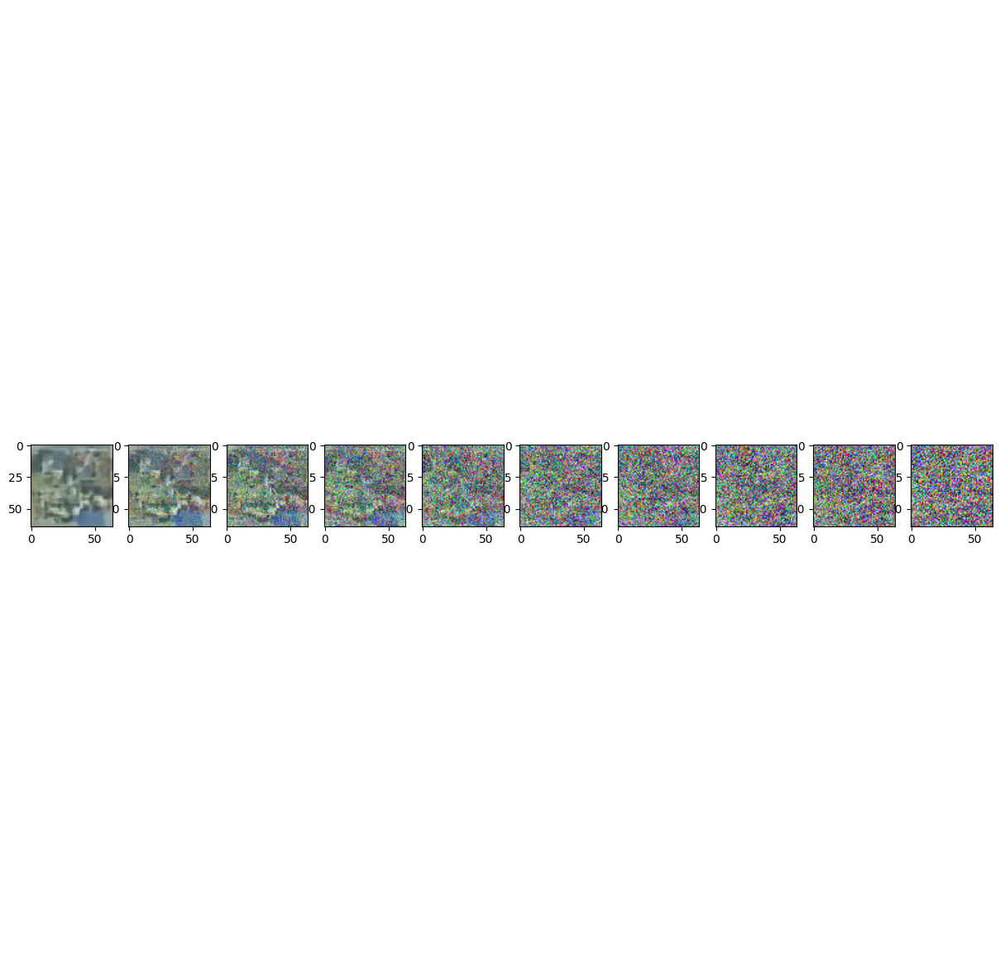

Starting epoch 31
Epoch 31, Step 0, Loss: 0.2028317153453827
Epoch 31, Step 1, Loss: 0.17591413855552673
Epoch 31, Step 2, Loss: 0.1806660145521164
Epoch 31, Step 3, Loss: 0.1846247911453247
Epoch 31, Step 4, Loss: 0.18296222388744354
Epoch 31, Step 5, Loss: 0.19159740209579468
Epoch 31, Step 6, Loss: 0.19032840430736542
Epoch 31, Step 7, Loss: 0.184556782245636
Epoch 31, Step 8, Loss: 0.19484607875347137
Epoch 31, Step 9, Loss: 0.18016378581523895
Epoch 31, Step 10, Loss: 0.18359264731407166
Epoch 31, Step 11, Loss: 0.18870621919631958
Epoch 31, Step 12, Loss: 0.18430382013320923
Epoch 31, Step 13, Loss: 0.1747579276561737
Epoch 31, Step 14, Loss: 0.2006913423538208
Epoch 31, Step 15, Loss: 0.18827924132347107
Epoch 31, Step 16, Loss: 0.18110394477844238
Epoch 31, Step 17, Loss: 0.18548107147216797
Epoch 31, Step 18, Loss: 0.1860688179731369
Epoch 31, Step 19, Loss: 0.18242347240447998
Epoch 31, Step 20, Loss: 0.16775116324424744
Epoch 31, Step 21, Loss: 0.18191781640052795
Epoch 31, 

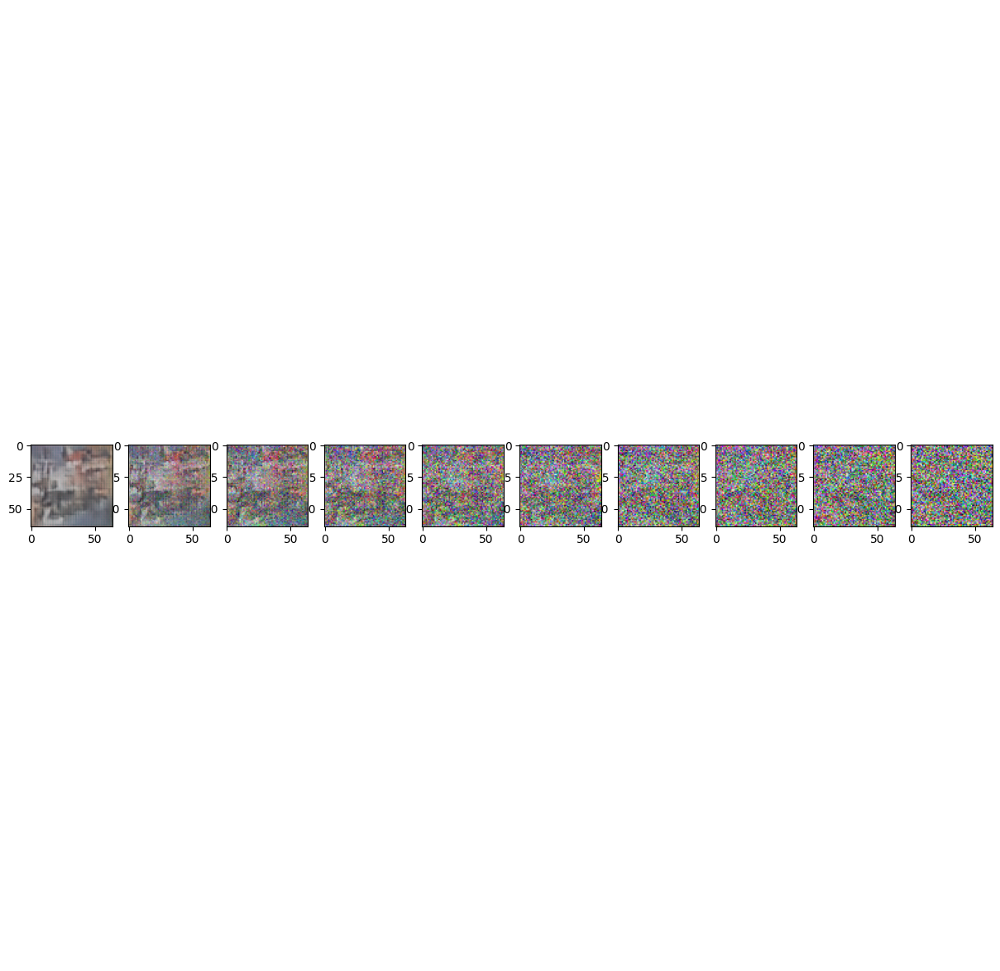

Starting epoch 36
Epoch 36, Step 0, Loss: 0.20088708400726318
Epoch 36, Step 1, Loss: 0.1742449849843979
Epoch 36, Step 2, Loss: 0.16639301180839539
Epoch 36, Step 3, Loss: 0.19653454422950745
Epoch 36, Step 4, Loss: 0.1734873652458191
Epoch 36, Step 5, Loss: 0.17489838600158691
Epoch 36, Step 6, Loss: 0.17389953136444092
Epoch 36, Step 7, Loss: 0.20185068249702454
Epoch 36, Step 8, Loss: 0.17971253395080566
Epoch 36, Step 9, Loss: 0.2013283371925354
Epoch 36, Step 10, Loss: 0.1730751395225525
Epoch 36, Step 11, Loss: 0.1754622459411621
Epoch 36, Step 12, Loss: 0.17154930531978607
Epoch 36, Step 13, Loss: 0.19219724833965302
Epoch 36, Step 14, Loss: 0.17987123131752014
Epoch 36, Step 15, Loss: 0.18842947483062744
Epoch 36, Step 16, Loss: 0.17604684829711914
Epoch 36, Step 17, Loss: 0.1869332492351532
Epoch 36, Step 18, Loss: 0.1851995885372162
Epoch 36, Step 19, Loss: 0.18797394633293152
Epoch 36, Step 20, Loss: 0.18090389668941498
Epoch 36, Step 21, Loss: 0.19394195079803467
Epoch 36,

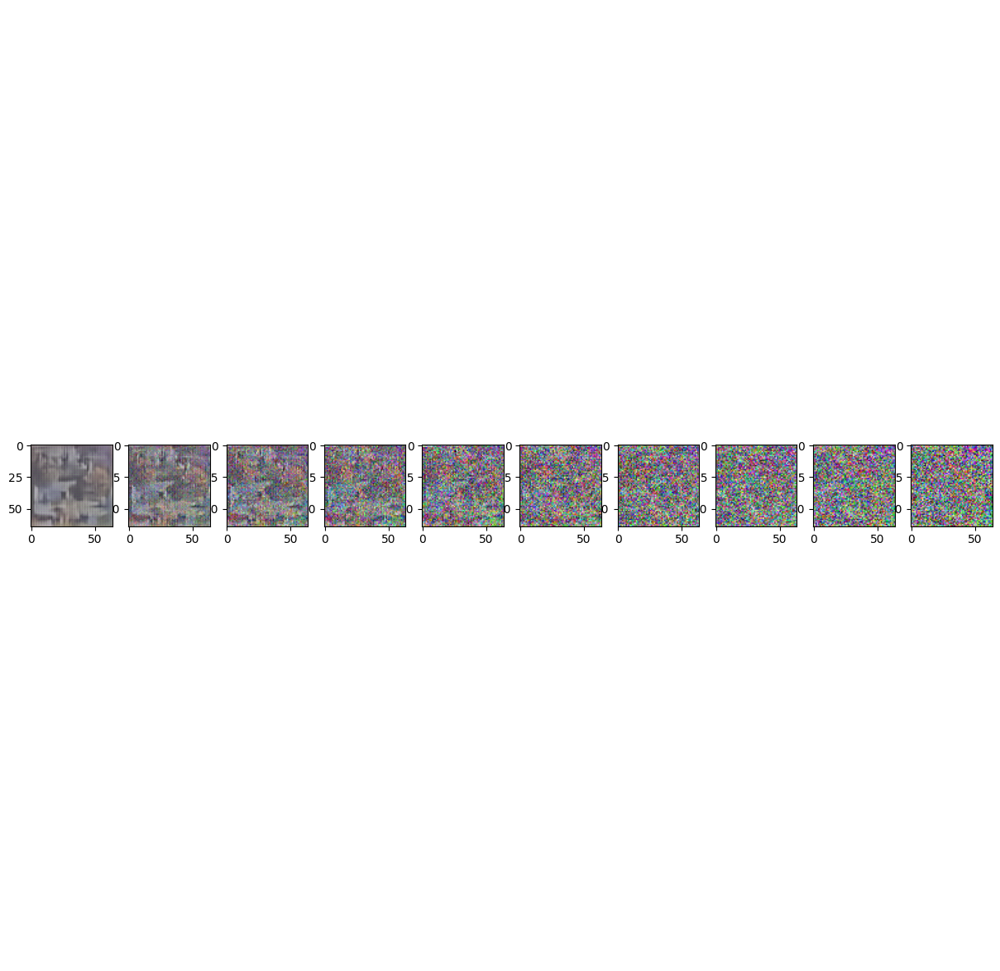

Starting epoch 41
Epoch 41, Step 0, Loss: 0.19067692756652832
Epoch 41, Step 1, Loss: 0.17135357856750488
Epoch 41, Step 2, Loss: 0.1969870775938034
Epoch 41, Step 3, Loss: 0.18622276186943054
Epoch 41, Step 4, Loss: 0.17785662412643433
Epoch 41, Step 5, Loss: 0.17863671481609344
Epoch 41, Step 6, Loss: 0.1872801035642624
Epoch 41, Step 7, Loss: 0.1758568286895752
Epoch 41, Step 8, Loss: 0.17127373814582825
Epoch 41, Step 9, Loss: 0.18368586897850037
Epoch 41, Step 10, Loss: 0.1858997344970703
Epoch 41, Step 11, Loss: 0.1831350326538086
Epoch 41, Step 12, Loss: 0.1690210998058319
Epoch 41, Step 13, Loss: 0.1744716465473175
Epoch 41, Step 14, Loss: 0.19263955950737
Epoch 41, Step 15, Loss: 0.17850717902183533
Epoch 41, Step 16, Loss: 0.1862494945526123
Epoch 41, Step 17, Loss: 0.18911747634410858
Epoch 41, Step 18, Loss: 0.18776476383209229
Epoch 41, Step 19, Loss: 0.1814085692167282
Epoch 41, Step 20, Loss: 0.16772493720054626
Epoch 41, Step 21, Loss: 0.1676507592201233
Epoch 41, Step 

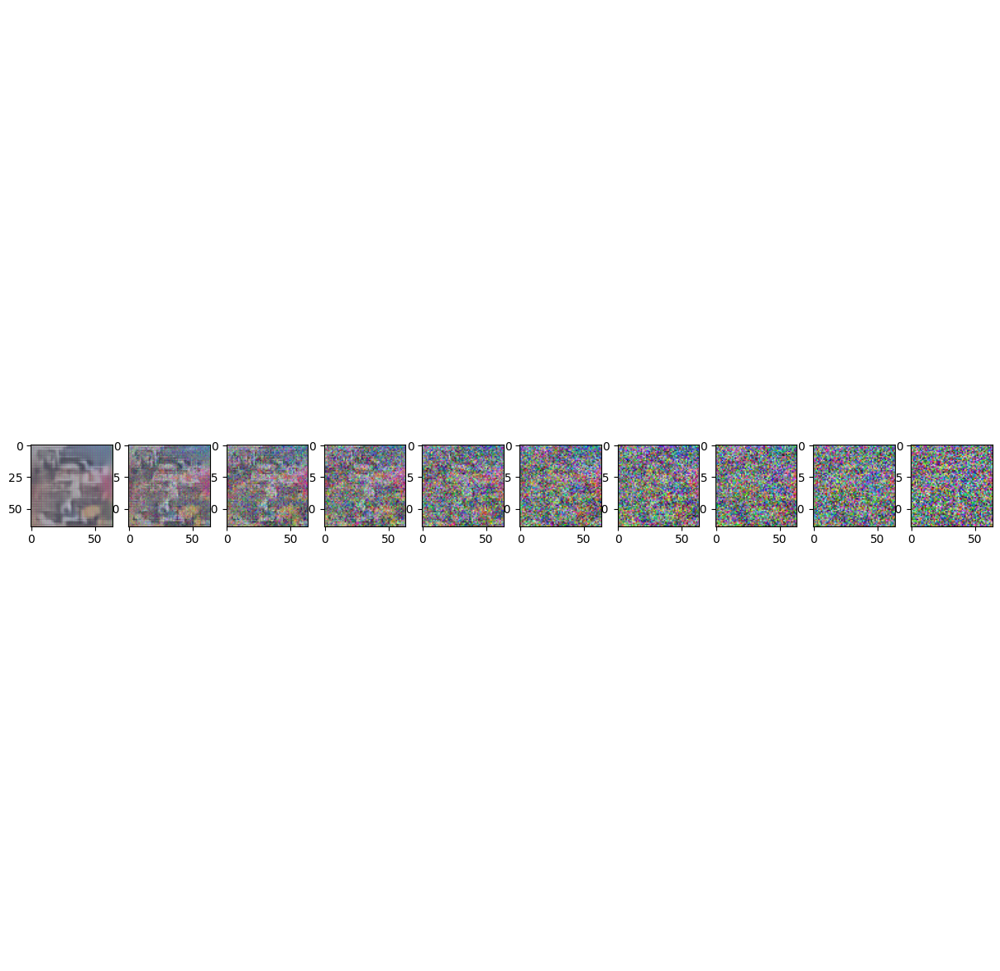

Starting epoch 46
Epoch 46, Step 0, Loss: 0.16374649107456207
Epoch 46, Step 1, Loss: 0.1847153902053833
Epoch 46, Step 2, Loss: 0.17501398921012878
Epoch 46, Step 3, Loss: 0.179832324385643
Epoch 46, Step 4, Loss: 0.16292373836040497
Epoch 46, Step 5, Loss: 0.18854282796382904
Epoch 46, Step 6, Loss: 0.16595607995986938
Epoch 46, Step 7, Loss: 0.17380432784557343
Epoch 46, Step 8, Loss: 0.17321085929870605
Epoch 46, Step 9, Loss: 0.16575010120868683
Epoch 46, Step 10, Loss: 0.17639009654521942
Epoch 46, Step 11, Loss: 0.17358767986297607
Epoch 46, Step 12, Loss: 0.17979910969734192
Epoch 46, Step 13, Loss: 0.18712890148162842
Epoch 46, Step 14, Loss: 0.1788664311170578
Epoch 46, Step 15, Loss: 0.17781470715999603
Epoch 46, Step 16, Loss: 0.18430456519126892
Epoch 46, Step 17, Loss: 0.18343786895275116
Epoch 46, Step 18, Loss: 0.17291651666164398
Epoch 46, Step 19, Loss: 0.17203471064567566
Epoch 46, Step 20, Loss: 0.17519962787628174
Epoch 46, Step 21, Loss: 0.1775297224521637
Epoch 4

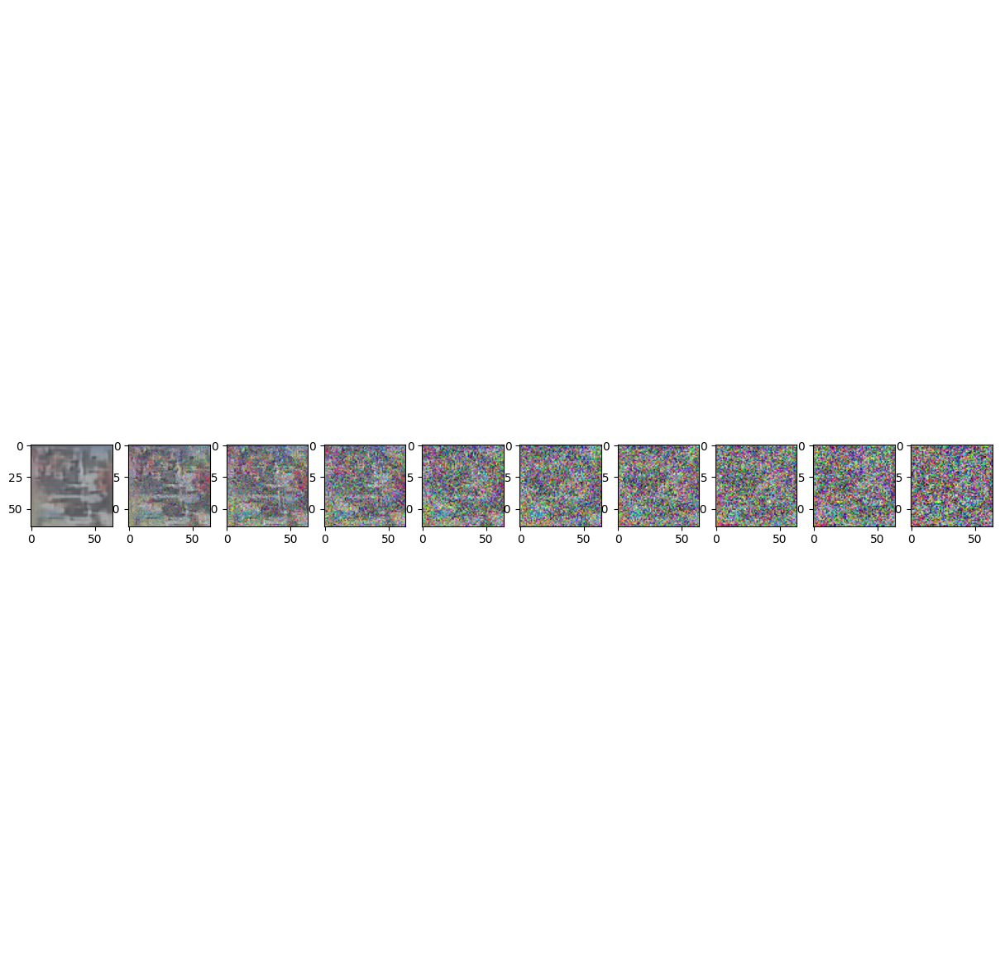

Starting epoch 51
Epoch 51, Step 0, Loss: 0.1739789843559265
Epoch 51, Step 1, Loss: 0.17130526900291443
Epoch 51, Step 2, Loss: 0.1839008331298828
Epoch 51, Step 3, Loss: 0.18296168744564056
Epoch 51, Step 4, Loss: 0.1871471405029297
Epoch 51, Step 5, Loss: 0.1835722178220749
Epoch 51, Step 6, Loss: 0.1765754520893097
Epoch 51, Step 7, Loss: 0.1942467987537384
Epoch 51, Step 8, Loss: 0.17121945321559906
Epoch 51, Step 9, Loss: 0.16874811053276062
Epoch 51, Step 10, Loss: 0.1707814633846283
Epoch 51, Step 11, Loss: 0.17545637488365173
Epoch 51, Step 12, Loss: 0.17280100286006927
Epoch 51, Step 13, Loss: 0.177082359790802
Epoch 51, Step 14, Loss: 0.1698051542043686
Epoch 51, Step 15, Loss: 0.17996865510940552
Epoch 51, Step 16, Loss: 0.17056821286678314
Epoch 51, Step 17, Loss: 0.164348304271698
Epoch 51, Step 18, Loss: 0.1537863314151764
Epoch 51, Step 19, Loss: 0.16942083835601807
Epoch 51, Step 20, Loss: 0.1607838273048401
Epoch 51, Step 21, Loss: 0.17003995180130005
Epoch 51, Step 2

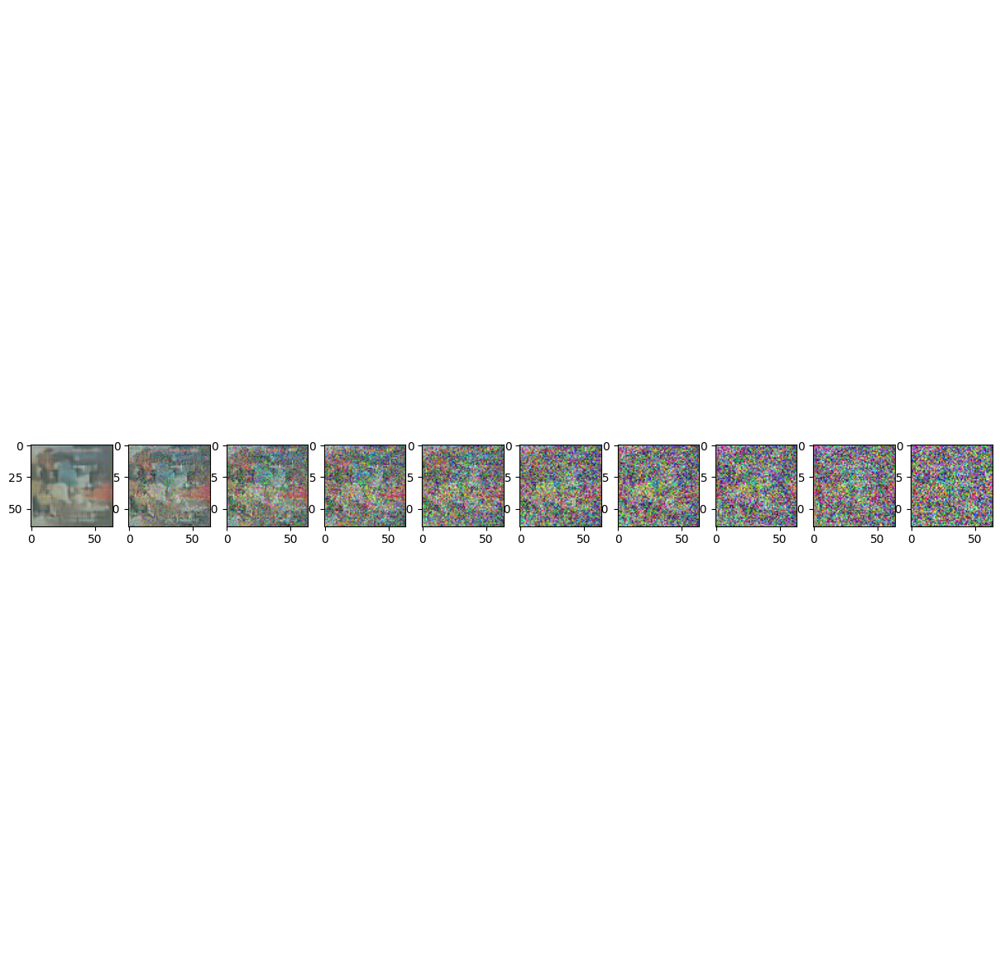

Starting epoch 56
Epoch 56, Step 0, Loss: 0.16171880066394806
Epoch 56, Step 1, Loss: 0.19826734066009521
Epoch 56, Step 2, Loss: 0.17150670289993286
Epoch 56, Step 3, Loss: 0.17329248785972595
Epoch 56, Step 4, Loss: 0.17778027057647705
Epoch 56, Step 5, Loss: 0.17199739813804626
Epoch 56, Step 6, Loss: 0.15976592898368835
Epoch 56, Step 7, Loss: 0.18389853835105896
Epoch 56, Step 8, Loss: 0.1705903261899948
Epoch 56, Step 9, Loss: 0.16650637984275818
Epoch 56, Step 10, Loss: 0.16927014291286469
Epoch 56, Step 11, Loss: 0.15872710943222046
Epoch 56, Step 12, Loss: 0.17390990257263184
Epoch 56, Step 13, Loss: 0.16632162034511566
Epoch 56, Step 14, Loss: 0.17735686898231506
Epoch 56, Step 15, Loss: 0.1789601892232895
Epoch 56, Step 16, Loss: 0.1559365838766098
Epoch 56, Step 17, Loss: 0.17094799876213074
Epoch 56, Step 18, Loss: 0.1623896062374115
Epoch 56, Step 19, Loss: 0.18869805335998535
Epoch 56, Step 20, Loss: 0.1699516475200653
Epoch 56, Step 21, Loss: 0.1975753754377365
Epoch 56

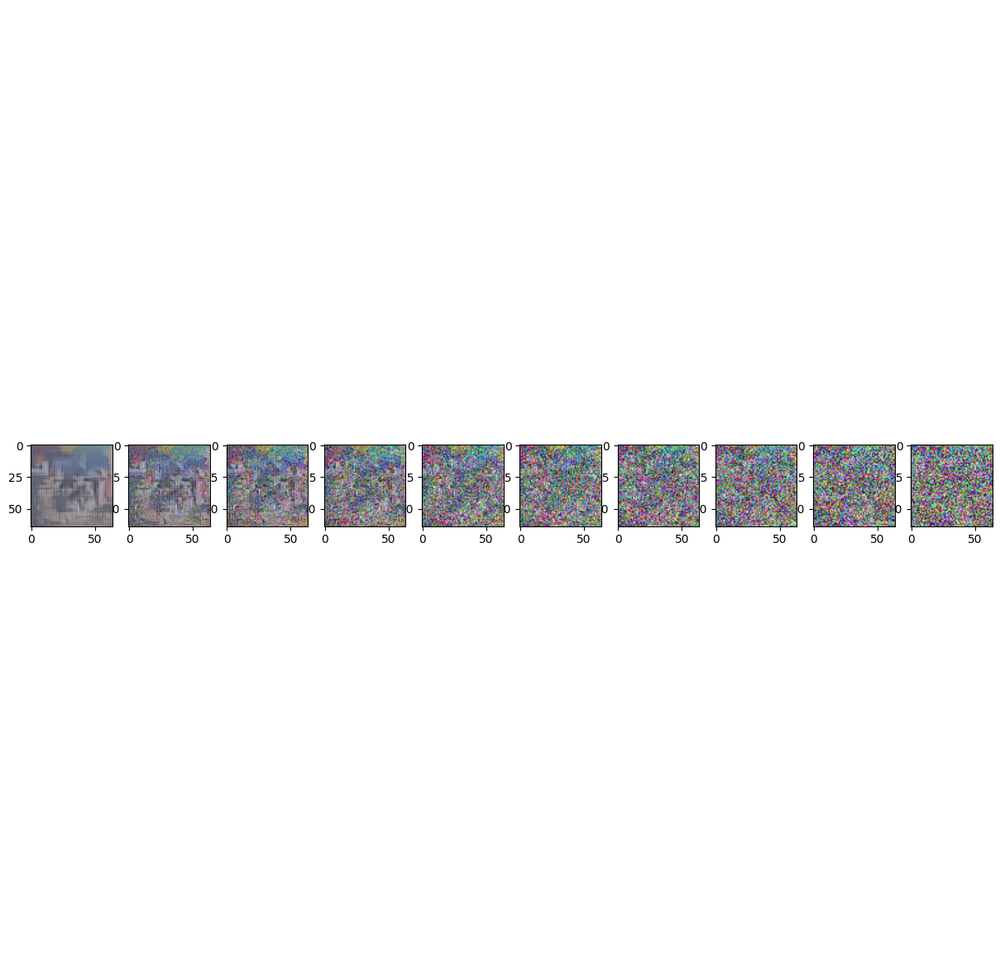

Starting epoch 61
Epoch 61, Step 0, Loss: 0.16799089312553406
Epoch 61, Step 1, Loss: 0.149221271276474
Epoch 61, Step 2, Loss: 0.16929122805595398
Epoch 61, Step 3, Loss: 0.17330271005630493
Epoch 61, Step 4, Loss: 0.1527252197265625
Epoch 61, Step 5, Loss: 0.18420961499214172
Epoch 61, Step 6, Loss: 0.18430444598197937
Epoch 61, Step 7, Loss: 0.17695002257823944
Epoch 61, Step 8, Loss: 0.17119066417217255
Epoch 61, Step 9, Loss: 0.18005764484405518
Epoch 61, Step 10, Loss: 0.16469764709472656
Epoch 61, Step 11, Loss: 0.1986372321844101
Epoch 61, Step 12, Loss: 0.18799683451652527
Epoch 61, Step 13, Loss: 0.175021693110466
Epoch 61, Step 14, Loss: 0.16450966894626617
Epoch 61, Step 15, Loss: 0.17019885778427124
Epoch 61, Step 16, Loss: 0.1654842346906662
Epoch 61, Step 17, Loss: 0.17488884925842285
Epoch 61, Step 18, Loss: 0.17201028764247894
Epoch 61, Step 19, Loss: 0.17975740134716034
Epoch 61, Step 20, Loss: 0.16982261836528778
Epoch 61, Step 21, Loss: 0.1733851134777069
Epoch 61, 

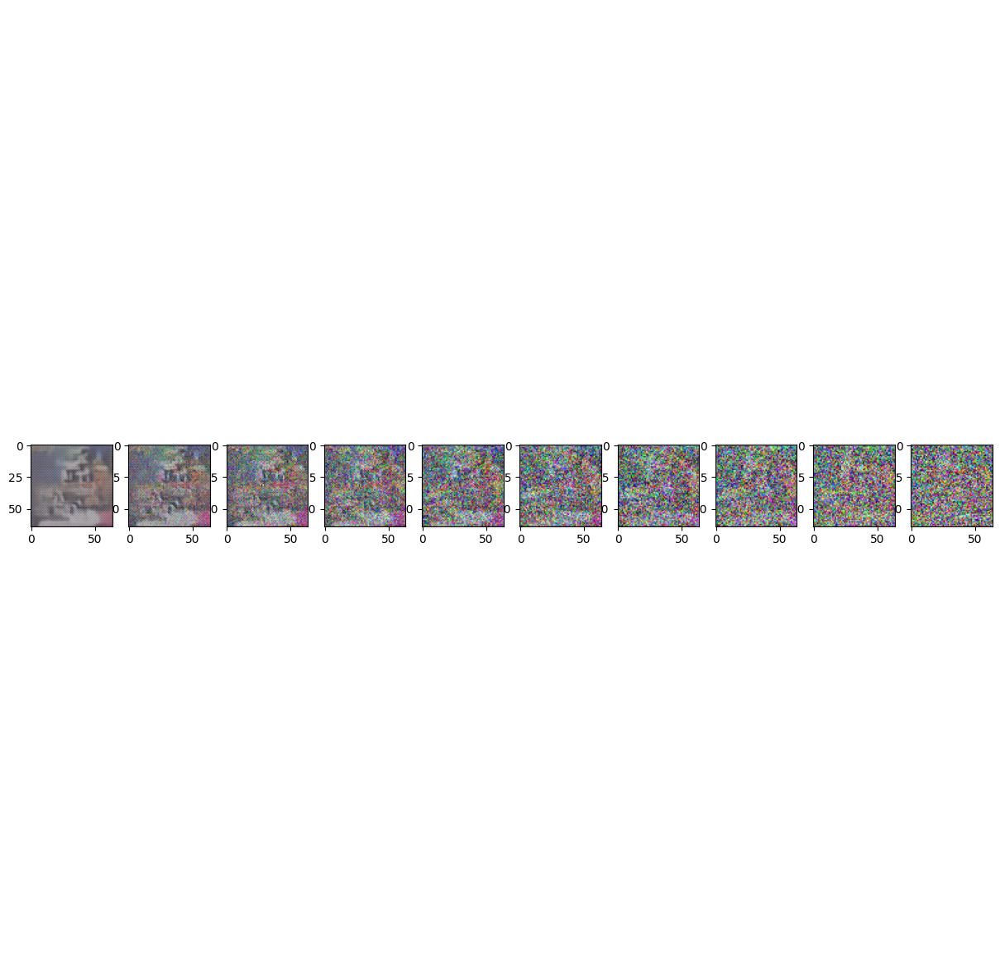

Starting epoch 66
Epoch 66, Step 0, Loss: 0.17254450917243958
Epoch 66, Step 1, Loss: 0.18450137972831726
Epoch 66, Step 2, Loss: 0.1705235242843628
Epoch 66, Step 3, Loss: 0.17804694175720215
Epoch 66, Step 4, Loss: 0.17712047696113586
Epoch 66, Step 5, Loss: 0.16915729641914368
Epoch 66, Step 6, Loss: 0.17074048519134521
Epoch 66, Step 7, Loss: 0.14543108642101288
Epoch 66, Step 8, Loss: 0.16244743764400482
Epoch 66, Step 9, Loss: 0.17363953590393066
Epoch 66, Step 10, Loss: 0.1742907464504242
Epoch 66, Step 11, Loss: 0.1636854112148285
Epoch 66, Step 12, Loss: 0.1721164435148239
Epoch 66, Step 13, Loss: 0.16216279566287994
Epoch 66, Step 14, Loss: 0.19222164154052734
Epoch 66, Step 15, Loss: 0.16805049777030945
Epoch 66, Step 16, Loss: 0.17984449863433838
Epoch 66, Step 17, Loss: 0.19268743693828583
Epoch 66, Step 18, Loss: 0.17184650897979736
Epoch 66, Step 19, Loss: 0.16681663691997528
Epoch 66, Step 20, Loss: 0.17050760984420776
Epoch 66, Step 21, Loss: 0.17079398036003113
Epoch 

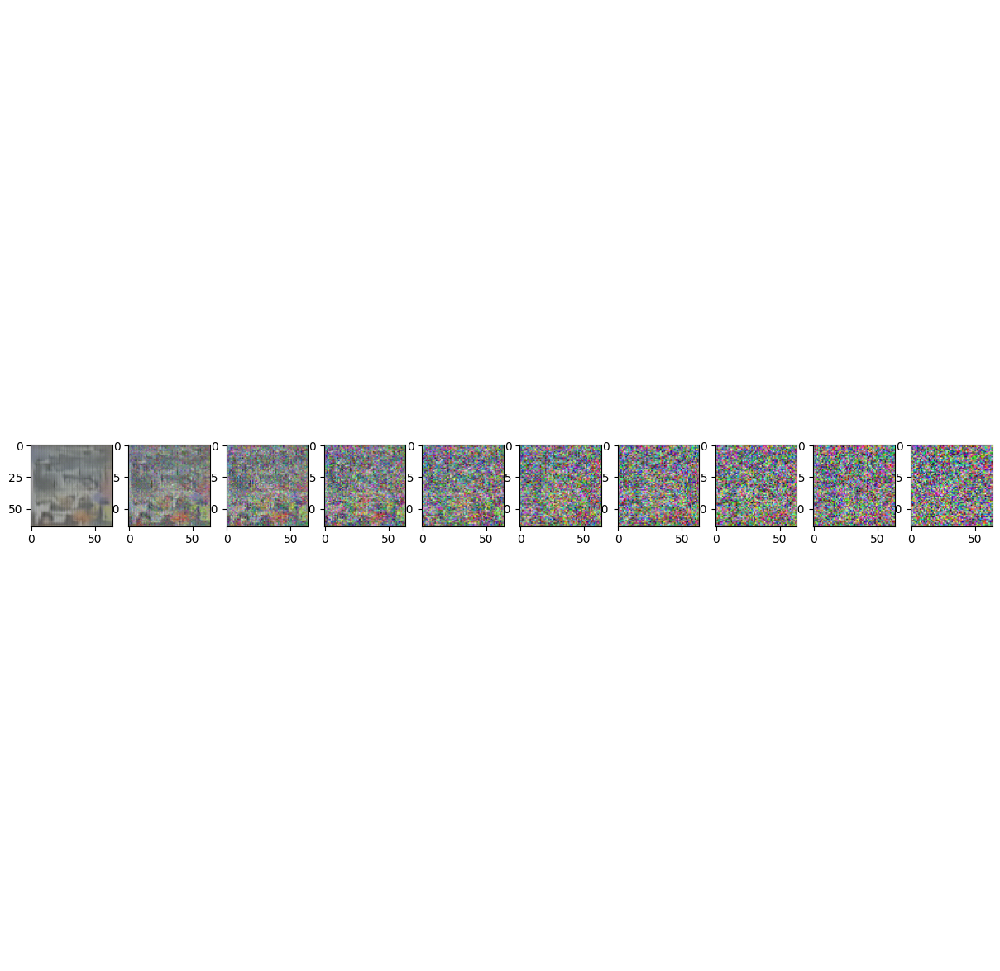

Starting epoch 71
Epoch 71, Step 0, Loss: 0.1804458349943161
Epoch 71, Step 1, Loss: 0.15157531201839447
Epoch 71, Step 2, Loss: 0.14914217591285706
Epoch 71, Step 3, Loss: 0.16290725767612457
Epoch 71, Step 4, Loss: 0.1658177226781845
Epoch 71, Step 5, Loss: 0.18174748122692108
Epoch 71, Step 6, Loss: 0.16930924355983734
Epoch 71, Step 7, Loss: 0.1690702736377716
Epoch 71, Step 8, Loss: 0.17596563696861267
Epoch 71, Step 9, Loss: 0.17739611864089966
Epoch 71, Step 10, Loss: 0.1722559779882431
Epoch 71, Step 11, Loss: 0.18050122261047363
Epoch 71, Step 12, Loss: 0.1640392243862152
Epoch 71, Step 13, Loss: 0.16398568451404572
Epoch 71, Step 14, Loss: 0.1841098964214325
Epoch 71, Step 15, Loss: 0.17256657779216766
Epoch 71, Step 16, Loss: 0.16817384958267212
Epoch 71, Step 17, Loss: 0.18363448977470398
Epoch 71, Step 18, Loss: 0.167097806930542
Epoch 71, Step 19, Loss: 0.18102148175239563
Epoch 71, Step 20, Loss: 0.1727645844221115
Epoch 71, Step 21, Loss: 0.16985681653022766
Epoch 71, S

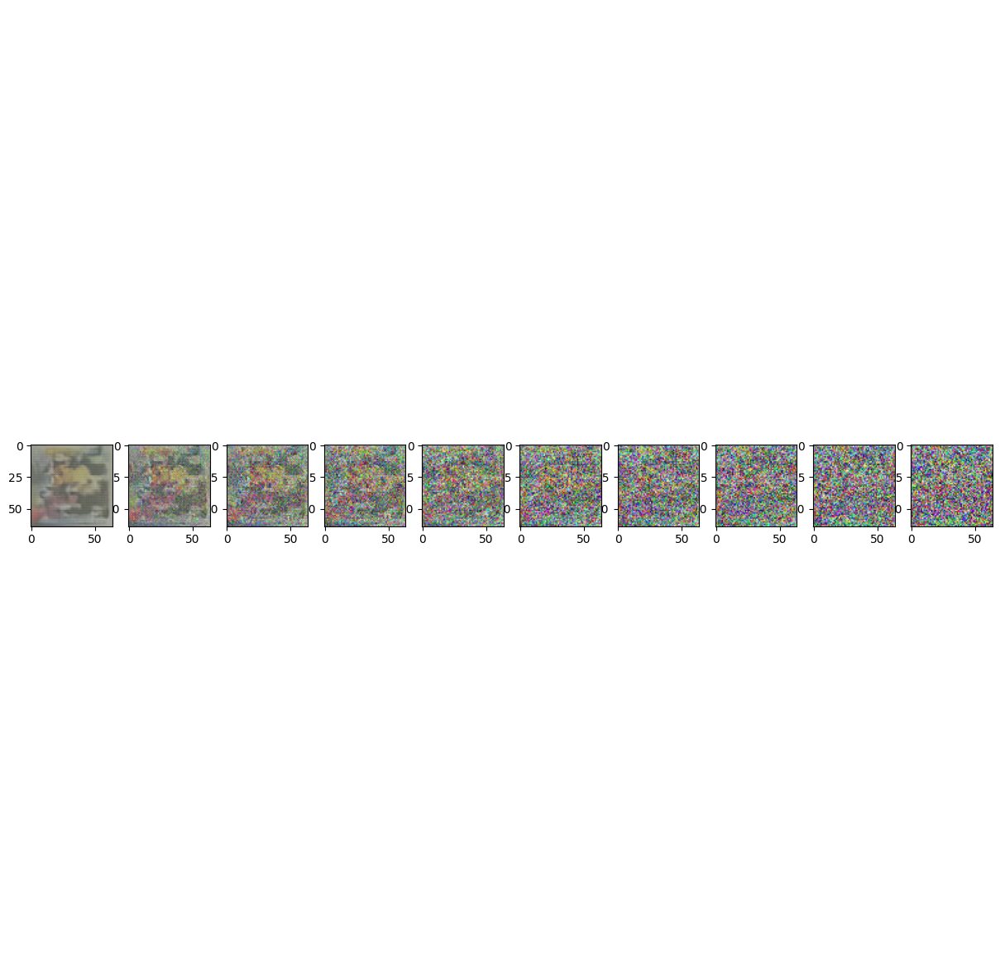

Starting epoch 76
Epoch 76, Step 0, Loss: 0.16781717538833618
Epoch 76, Step 1, Loss: 0.1698864996433258
Epoch 76, Step 2, Loss: 0.1665406972169876
Epoch 76, Step 3, Loss: 0.16644832491874695
Epoch 76, Step 4, Loss: 0.15817920863628387
Epoch 76, Step 5, Loss: 0.16414320468902588
Epoch 76, Step 6, Loss: 0.17017030715942383
Epoch 76, Step 7, Loss: 0.1746540069580078
Epoch 76, Step 8, Loss: 0.1679445505142212
Epoch 76, Step 9, Loss: 0.1545196771621704
Epoch 76, Step 10, Loss: 0.1725020855665207
Epoch 76, Step 11, Loss: 0.1929451823234558
Epoch 76, Step 12, Loss: 0.1753637194633484
Epoch 76, Step 13, Loss: 0.19054673612117767
Epoch 76, Step 14, Loss: 0.18256878852844238
Epoch 76, Step 15, Loss: 0.18162739276885986
Epoch 76, Step 16, Loss: 0.16301138699054718
Epoch 76, Step 17, Loss: 0.17483583092689514
Epoch 76, Step 18, Loss: 0.17141930758953094
Epoch 76, Step 19, Loss: 0.16397947072982788
Epoch 76, Step 20, Loss: 0.176614448428154
Epoch 76, Step 21, Loss: 0.19952654838562012
Epoch 76, St

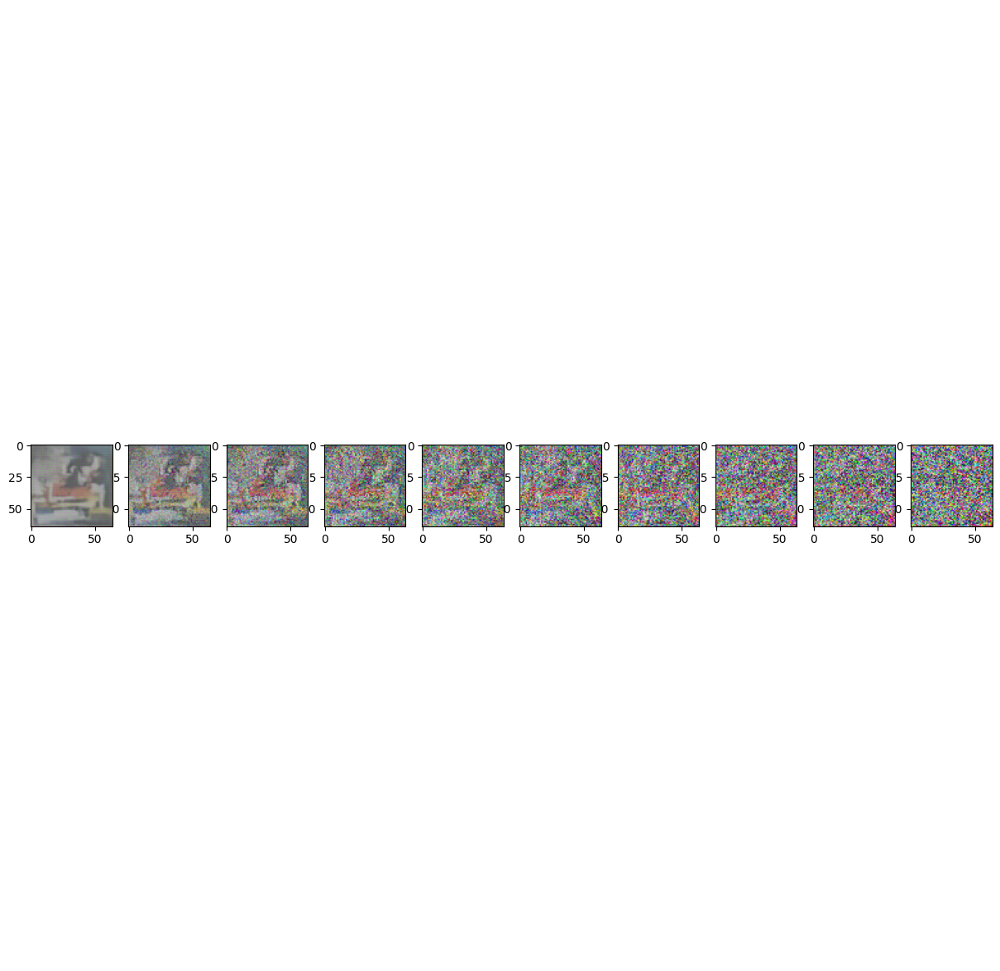

Starting epoch 81
Epoch 81, Step 0, Loss: 0.18075190484523773
Epoch 81, Step 1, Loss: 0.16135315597057343
Epoch 81, Step 2, Loss: 0.15880636870861053
Epoch 81, Step 3, Loss: 0.1666412204504013
Epoch 81, Step 4, Loss: 0.17192380130290985
Epoch 81, Step 5, Loss: 0.16855132579803467
Epoch 81, Step 6, Loss: 0.1646014004945755
Epoch 81, Step 7, Loss: 0.1600225418806076
Epoch 81, Step 8, Loss: 0.15592972934246063
Epoch 81, Step 9, Loss: 0.16743771731853485
Epoch 81, Step 10, Loss: 0.18085253238677979
Epoch 81, Step 11, Loss: 0.15789000689983368
Epoch 81, Step 12, Loss: 0.16588547825813293
Epoch 81, Step 13, Loss: 0.17663924396038055
Epoch 81, Step 14, Loss: 0.15867552161216736
Epoch 81, Step 15, Loss: 0.19042837619781494
Epoch 81, Step 16, Loss: 0.1645270586013794
Epoch 81, Step 17, Loss: 0.1914762556552887
Epoch 81, Step 18, Loss: 0.18813654780387878
Epoch 81, Step 19, Loss: 0.16716217994689941
Epoch 81, Step 20, Loss: 0.16151054203510284
Epoch 81, Step 21, Loss: 0.16910681128501892
Epoch 8

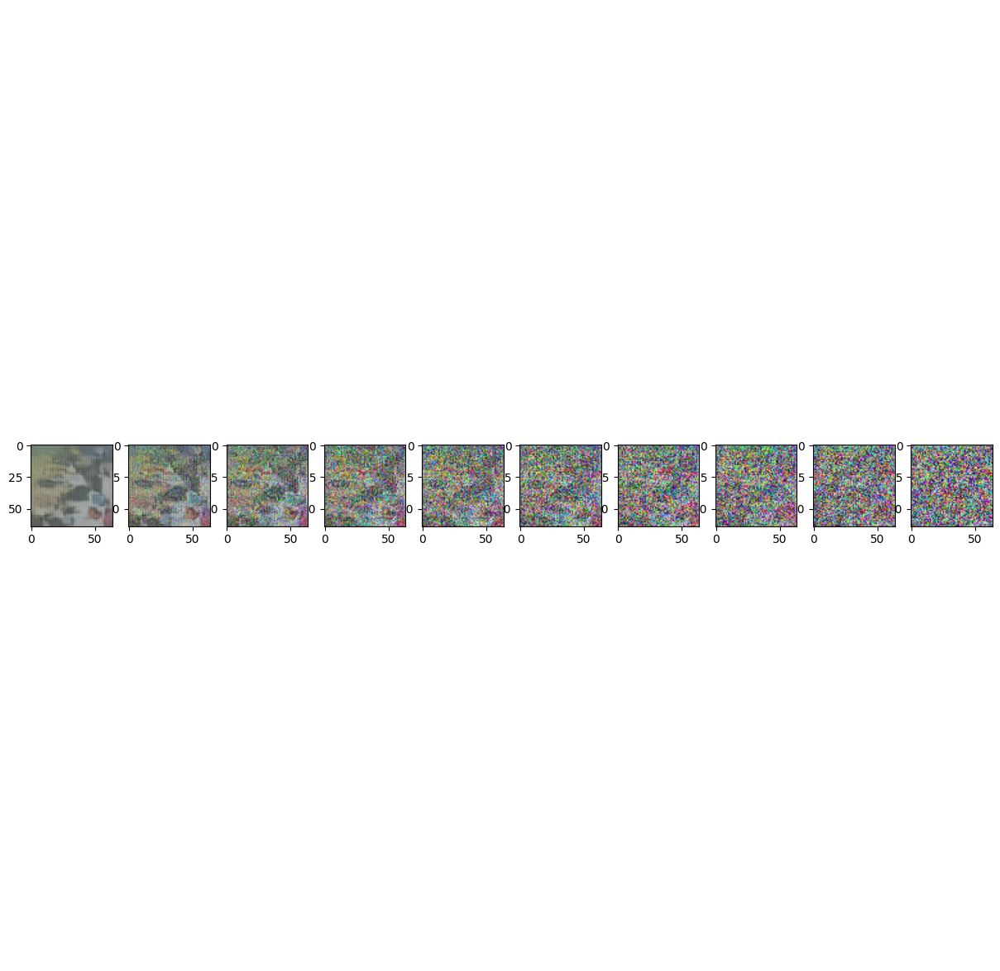

Starting epoch 86
Epoch 86, Step 0, Loss: 0.17351633310317993
Epoch 86, Step 1, Loss: 0.15909144282341003
Epoch 86, Step 2, Loss: 0.1799311637878418
Epoch 86, Step 3, Loss: 0.17853662371635437
Epoch 86, Step 4, Loss: 0.17730645835399628
Epoch 86, Step 5, Loss: 0.18086016178131104
Epoch 86, Step 6, Loss: 0.16067743301391602
Epoch 86, Step 7, Loss: 0.18344691395759583
Epoch 86, Step 8, Loss: 0.16050662100315094
Epoch 86, Step 9, Loss: 0.16314852237701416
Epoch 86, Step 10, Loss: 0.1701669991016388
Epoch 86, Step 11, Loss: 0.16199156641960144
Epoch 86, Step 12, Loss: 0.1682322472333908
Epoch 86, Step 13, Loss: 0.16990284621715546
Epoch 86, Step 14, Loss: 0.17264299094676971
Epoch 86, Step 15, Loss: 0.16753646731376648
Epoch 86, Step 16, Loss: 0.18239443004131317
Epoch 86, Step 17, Loss: 0.15999901294708252
Epoch 86, Step 18, Loss: 0.1721816509962082
Epoch 86, Step 19, Loss: 0.17379340529441833
Epoch 86, Step 20, Loss: 0.15968674421310425
Epoch 86, Step 21, Loss: 0.1814538687467575
Epoch 8

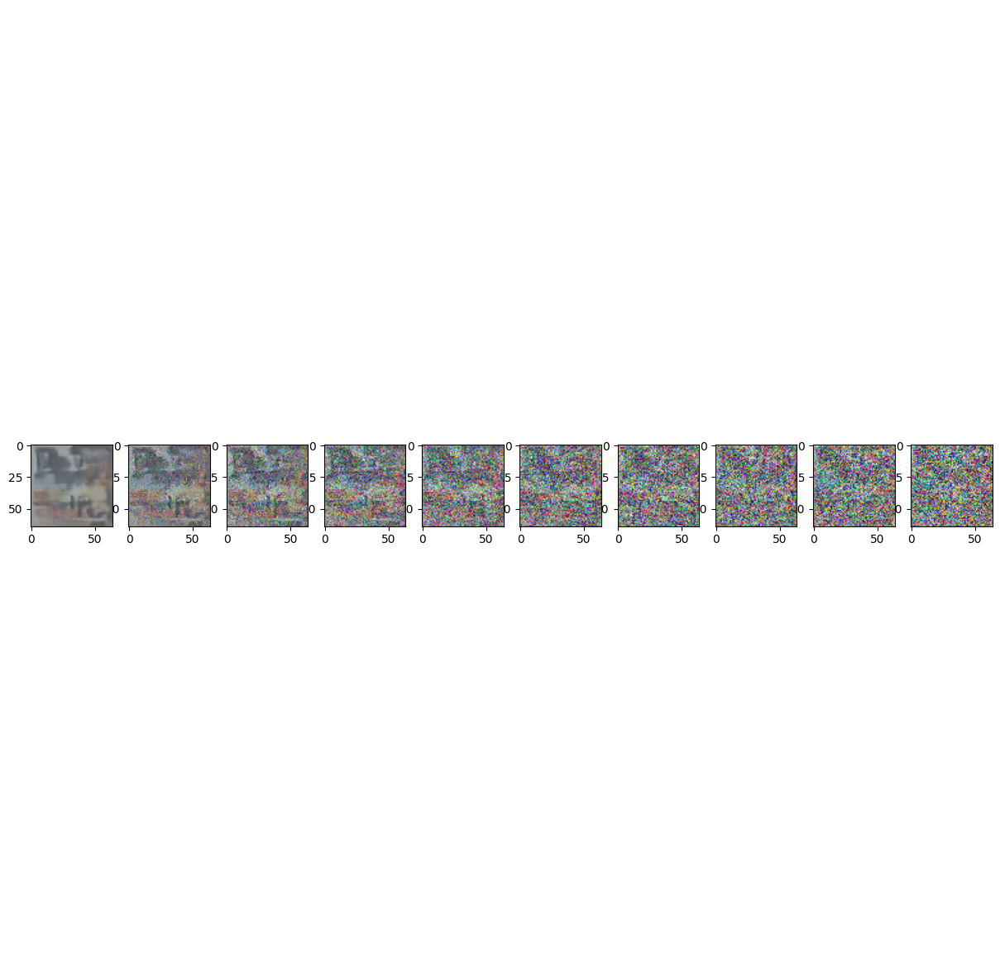

Starting epoch 91
Epoch 91, Step 0, Loss: 0.17411980032920837
Epoch 91, Step 1, Loss: 0.16835737228393555
Epoch 91, Step 2, Loss: 0.18815521895885468
Epoch 91, Step 3, Loss: 0.16977344453334808
Epoch 91, Step 4, Loss: 0.17873921990394592
Epoch 91, Step 5, Loss: 0.17729847133159637
Epoch 91, Step 6, Loss: 0.18515674769878387
Epoch 91, Step 7, Loss: 0.1791197955608368
Epoch 91, Step 8, Loss: 0.17288772761821747
Epoch 91, Step 9, Loss: 0.17025405168533325
Epoch 91, Step 10, Loss: 0.1676063984632492
Epoch 91, Step 11, Loss: 0.1611565202474594
Epoch 91, Step 12, Loss: 0.17426130175590515
Epoch 91, Step 13, Loss: 0.1644403040409088
Epoch 91, Step 14, Loss: 0.1582290232181549
Epoch 91, Step 15, Loss: 0.16523292660713196
Epoch 91, Step 16, Loss: 0.17787258327007294
Epoch 91, Step 17, Loss: 0.1667596995830536
Epoch 91, Step 18, Loss: 0.16502876579761505
Epoch 91, Step 19, Loss: 0.15886521339416504
Epoch 91, Step 20, Loss: 0.17805740237236023
Epoch 91, Step 21, Loss: 0.16289588809013367
Epoch 91

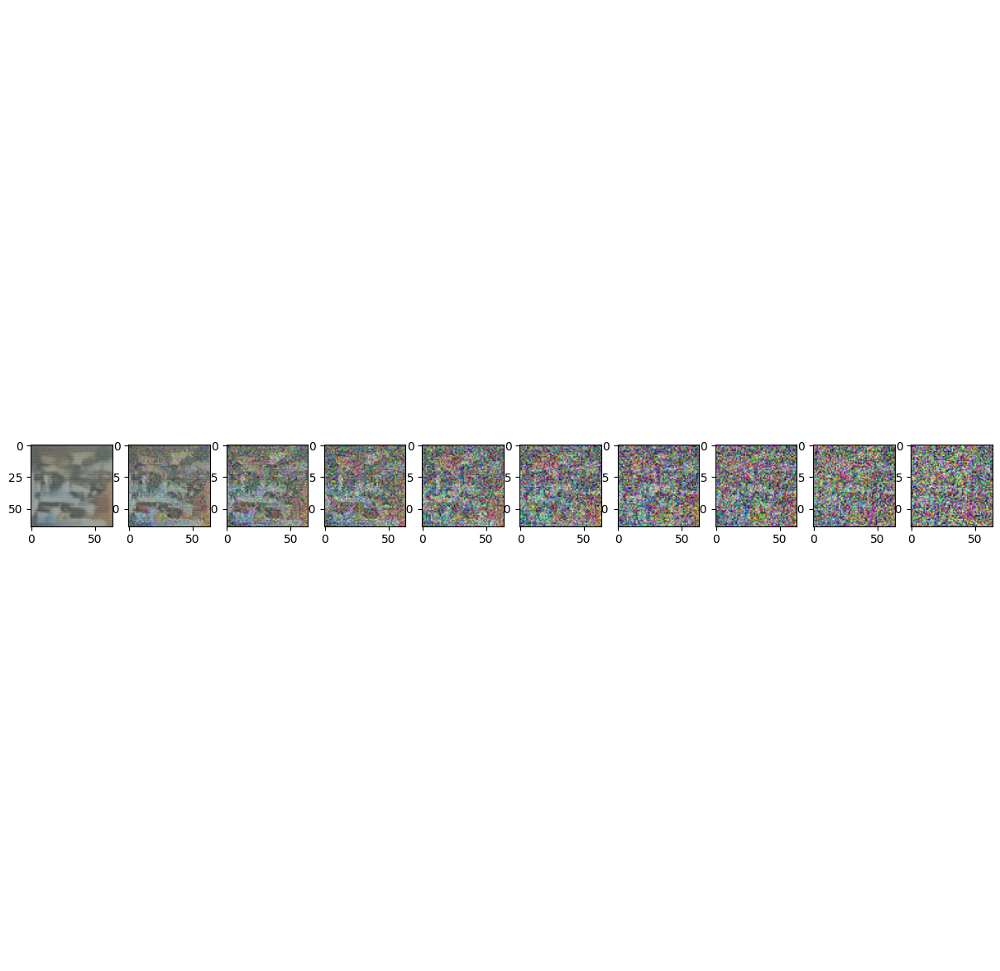

Starting epoch 96
Epoch 96, Step 0, Loss: 0.1724986732006073
Epoch 96, Step 1, Loss: 0.17301949858665466
Epoch 96, Step 2, Loss: 0.17635929584503174
Epoch 96, Step 3, Loss: 0.1851808875799179
Epoch 96, Step 4, Loss: 0.16290190815925598
Epoch 96, Step 5, Loss: 0.1683877557516098
Epoch 96, Step 6, Loss: 0.17393094301223755
Epoch 96, Step 7, Loss: 0.17263774573802948
Epoch 96, Step 8, Loss: 0.18146035075187683
Epoch 96, Step 9, Loss: 0.16137489676475525
Epoch 96, Step 10, Loss: 0.178509920835495
Epoch 96, Step 11, Loss: 0.1647133231163025
Epoch 96, Step 12, Loss: 0.1619613617658615
Epoch 96, Step 13, Loss: 0.17716066539287567
Epoch 96, Step 14, Loss: 0.15954653918743134
Epoch 96, Step 15, Loss: 0.15510991215705872
Epoch 96, Step 16, Loss: 0.16485385596752167
Epoch 96, Step 17, Loss: 0.15788304805755615
Epoch 96, Step 18, Loss: 0.15158939361572266
Epoch 96, Step 19, Loss: 0.17052346467971802
Epoch 96, Step 20, Loss: 0.1852724552154541
Epoch 96, Step 21, Loss: 0.17021045088768005
Epoch 96, 

In [12]:
from torch.optim import Adam

device = "cuda" if torch.cuda.is_available() else "cpu"
model.to(device)
optimizer = Adam(model.parameters(), lr=0.001)
epochs = 100

for epoch in range(epochs):
    print(f"Starting epoch {epoch}")
    for step, batch in enumerate(dataloader):
        batch[0] = batch[0].to(device)  # Move batch to device
        optimizer.zero_grad()

        t = torch.randint(0, T, (BATCH_SIZE,), device=device).long()
        loss = get_loss(model, batch[0], t)
        loss.backward()
        optimizer.step()

        print(f"Epoch {epoch}, Step {step}, Loss: {loss.item()}")

    if epoch % 5 == 0:
        sample_plot_image()


In [13]:
# Save only the model's state_dict
torch.save(model.state_dict(), 'model_weights.pth')


In [14]:
import torch

# PyTorch version
print(f"PyTorch Version: {torch.__version__}")

# CUDA version (if available)
if torch.cuda.is_available():
    print(f"CUDA Version: {torch.version.cuda}")
    print(f"CUDA Available: {torch.cuda.is_available()}")
    print(f"GPU Device: {torch.cuda.get_device_name(0)}")
else:
    print("CUDA is not available.")


PyTorch Version: 2.5.1+cu118
CUDA Version: 11.8
CUDA Available: True
GPU Device: NVIDIA GeForce GTX 1660 Ti


In [15]:
!pip freeze > requirements.txt


In [16]:
import sys
print(f"Python Version: {sys.version}")


Python Version: 3.12.6 (tags/v3.12.6:a4a2d2b, Sep  6 2024, 20:11:23) [MSC v.1940 64 bit (AMD64)]
